<h1>Content-based Product Recommendations </h1>



In [1]:
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
# we have give a json file which consists of all information about the products
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')

print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [3]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

Of these 19 features, we will be using only 7 features in this project.

1. asin  ( Amazon standard identification number)
2. brand ( brand to which the product belongs to )
3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
5. medium_image_url  ( url of the image )
6. title (title of the product.)
7. formatted_price (price of the product)

In [4]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


# Missing data for various features.

In [5]:
#Basic stats for the feature: product_type_name

print(data['product_type_name'].describe())
# We have total 72 unique type of product_type_names
# 91.62% (167794/183138) of the products are shirts,


count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [6]:
# names of different product types
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [7]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

In [8]:
#Basic stats for the feature: brand

print(data['brand'].describe())
# there are 10577 unique brands
# 183138 - 182987 = 151 missing values.


count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [9]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

In [10]:
#  Basic stats for the feature: color

print(data['color'].describe())

# we have 7380 unique colors
# 7.2% of products are black in color
# 64956 of 183138 products have color information. That's approx 35.4%.

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [11]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

In [12]:
#  Basic stats for the feature: formatted_price
print(data['formatted_price'].describe())

# Only 28,395 (15.5% of whole data) products with price information

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [13]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

In [14]:
# Basic stats for the feature: title

print(data['title'].describe())

# All of the products have a title. 
# Titles are fairly descriptive of what the product is. 
# We use titles extensively in this project 
# as they are short and informative.

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [15]:
data.to_pickle('180k_apparel_data')
# We save data files at every major step in our processing in "pickle" files

In [16]:
# only consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [17]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])
# We brought down the number of data points from 183K  to 28K.

Number of data points After eliminating color=NULL : 28385


In [18]:
data.to_pickle('28k_apparel_data')

In [19]:
#Understand about duplicates.
# read data from pickle file from previous stage
data = pd.read_pickle('28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))
# we have 2325 products which have same title but different color

2325


#### These shirts are exactly same except in size (S, M,L,XL)

<table>
<tr> 
<td><img src="B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

#### These shirts exactly same except  in color

<table>
<tr> 
<td><img src="B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


####  Remove duplicates : Part 1

In [20]:
# read data from pickle file from previous stage
data = pd.read_pickle('28k_apparel_data')

In [21]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [22]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [23]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [24]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [25]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])


            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [26]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [27]:
print('Number of data points : ', data.shape[0])

Number of data points :  17592


In [28]:
data.to_pickle('17k_apperal_data')

#### [5.2.3] Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1

UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large

UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2

  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee

  EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees

  EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [29]:
data = pd.read_pickle('17k_apperal_data')

In [ ]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [77]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [78]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16434


In [79]:
data.to_pickle('16k_apperal_data')
# Storing these products in a pickle file

#  Text pre-processing

In [2]:
data = pd.read_pickle('16k_apperal_data')

# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the cmd propmpt, type these commands
# $python3
# $import nltk
# $nltk.download()

In [3]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'the', 'she', 'out', 'your', 'than', 'same', 'who', 'then', 've', "mustn't", 'hadn', 'during', 'myself', 'mustn', 're', "didn't", 's', 'very', 'about', 'some', 'had', 'himself', "you'll", 'do', 'at', 'doesn', 'they', 'more', 'over', 'nor', 'both', 'we', 'before', 'any', 'to', 'should', 'which', 'so', 'has', 'are', 'y', 'i', 'now', 'why', 'ours', 'in', 'as', 'its', 'aren', 'those', 'don', 'after', 'her', 'of', 'itself', 'needn', 'below', 'shouldn', 'ourselves', 'where', "she's", 'isn', "wasn't", 'am', "it's", 'not', 'own', 'shan', 'again', 'because', "haven't", "don't", 'by', 'was', 'have', 'when', 'too', 'be', 'under', "aren't", 'an', 'yourself', 'with', 'such', 'will', 'wasn', 'him', 'only', "needn't", 'you', "should've", 'did', 'between', 'up', 'their', 'it', 'off', "doesn't", 'couldn', 'does', 'were', "isn't", 'each', 'few', 'all', "you've", "mightn't", 'this', 'having', 'and', 'if', "you're", 'hasn', 'most', 'my', 'hers', 'theirs', "shouldn't", 'his', 't', 'our

In [4]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

3.4669936999999997 seconds


In [5]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [6]:
data.to_pickle('16k_apperal_data_preprocessed')

## Stemming 

In [7]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))


# We tried using stemming on our titles and it didnot work very well. 


argu
fish


#  Text based product similarity

In [8]:
data = pd.read_pickle('16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [9]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

##  Bag of Words (BoW) on product titles.

In [10]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16434, 12684)

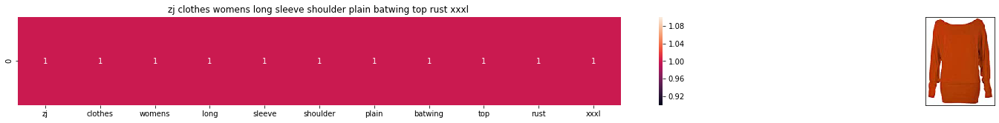

ASIN : B017N15BHK
Brand: ZJ Clothes
Title: zj clothes womens long sleeve shoulder plain batwing top rust xxxl 
Euclidean similarity with the query image : 0.0


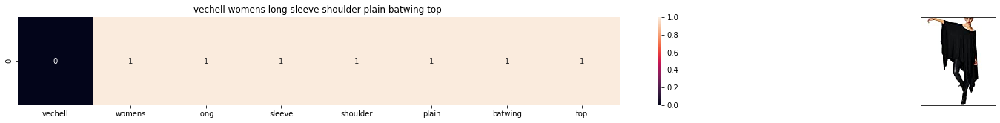

ASIN : B017B3H7W2
Brand: Hot Hanger
Title: vechell womens long sleeve shoulder plain batwing top 
Euclidean similarity with the query image : 2.23606797749979


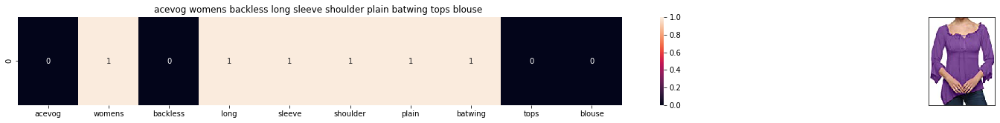

ASIN : B01CE4GMGU
Brand: ACEVOG
Title: acevog womens backless long sleeve shoulder plain batwing tops blouse 
Euclidean similarity with the query image : 3.0


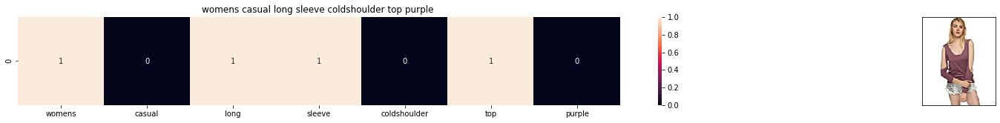

ASIN : B01I2WWAPU
Brand: Milkuu
Title: womens casual long sleeve coldshoulder top purple 
Euclidean similarity with the query image : 3.1622776601683795


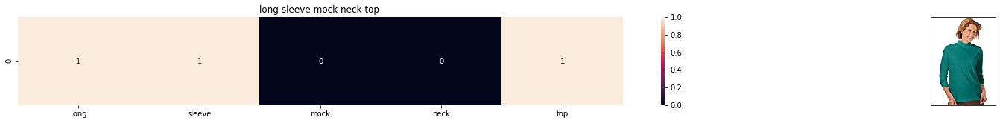

ASIN : B01KZYEWKO
Brand: AmeriMark
Title: long sleeve mock neck top 
Euclidean similarity with the query image : 3.1622776601683795


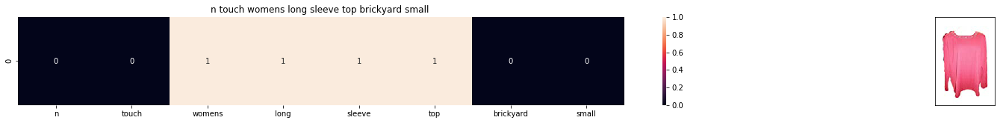

ASIN : B01F2UE6QG
Brand: NTouch
Title: n touch womens long sleeve top brickyard small 
Euclidean similarity with the query image : 3.1622776601683795


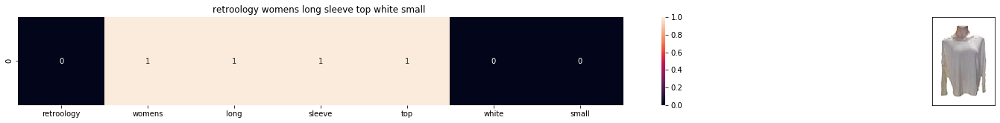

ASIN : B06XH2N9SG
Brand: Retro-ology
Title: retroology womens long sleeve top white small 
Euclidean similarity with the query image : 3.1622776601683795


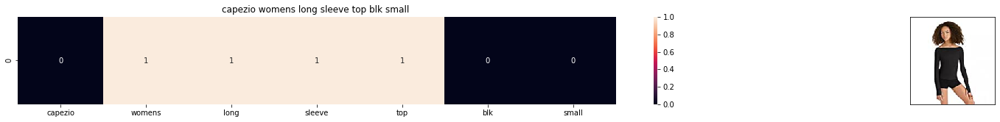

ASIN : B01G4HRW8K
Brand: Capezio
Title: capezio womens long sleeve top blk small 
Euclidean similarity with the query image : 3.1622776601683795


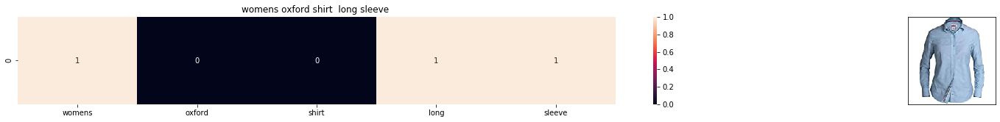

ASIN : B01577JZOC
Brand: Boast
Title: womens oxford shirt  long sleeve 
Euclidean similarity with the query image : 3.1622776601683795


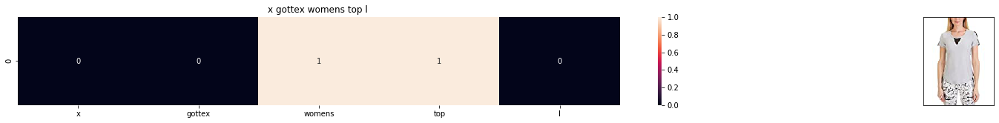

ASIN : B073M78XLP
Brand: X by Gottex
Title: x gottex womens top l 
Euclidean similarity with the query image : 3.1622776601683795


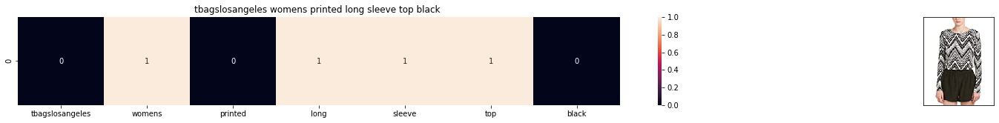

ASIN : B01N3239P2
Brand: tbagslosangeles
Title: tbagslosangeles womens printed long sleeve top black 
Euclidean similarity with the query image : 3.1622776601683795


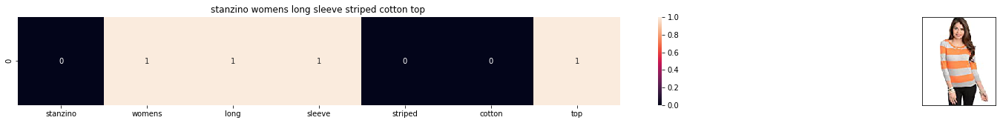

ASIN : B00IMNJGIY
Brand: Stanzino
Title: stanzino womens long sleeve striped cotton top 
Euclidean similarity with the query image : 3.1622776601683795


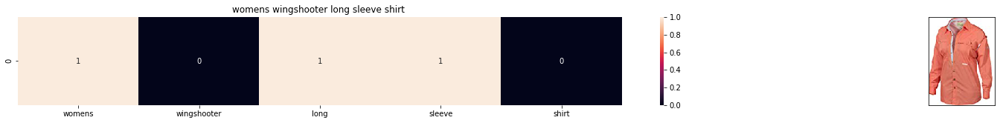

ASIN : B01BNWY6CQ
Brand: Drake
Title: womens wingshooter long sleeve shirt 
Euclidean similarity with the query image : 3.1622776601683795


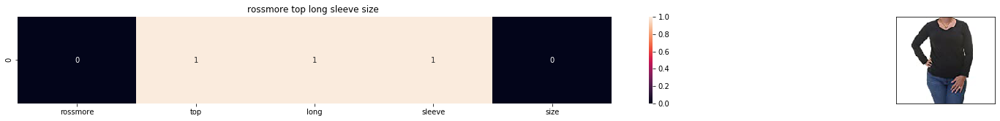

ASIN : B014LKPLYE
Brand: Rossmore
Title: rossmore top long sleeve size 
Euclidean similarity with the query image : 3.1622776601683795


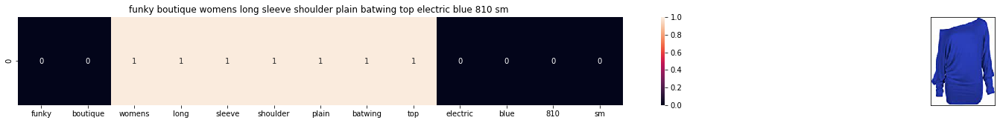

ASIN : B009FV8I9K
Brand: Hot Hanger
Title: funky boutique womens long sleeve shoulder plain batwing top electric blue 810 sm 
Euclidean similarity with the query image : 3.1622776601683795


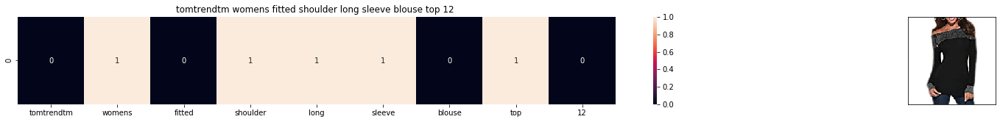

ASIN : B01A5MR31G
Brand: Tom_trend
Title: tomtrendtm womens fitted shoulder long sleeve blouse top 12 
Euclidean similarity with the query image : 3.1622776601683795


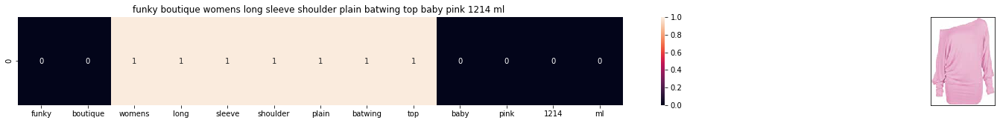

ASIN : B009FV8R7I
Brand: Hot Hanger
Title: funky boutique womens long sleeve shoulder plain batwing top baby pink 1214 ml 
Euclidean similarity with the query image : 3.1622776601683795


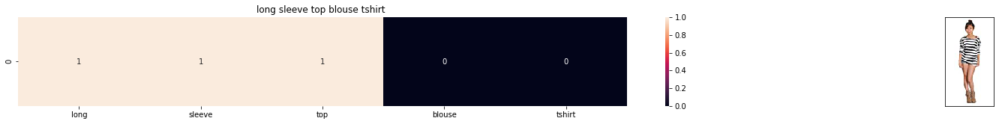

ASIN : B00KF2N5PU
Brand: Vietsbay
Title: long sleeve top blouse tshirt 
Euclidean similarity with the query image : 3.1622776601683795


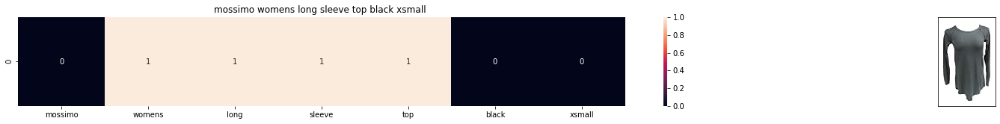

ASIN : B07173L752
Brand: Mossimo
Title: mossimo womens long sleeve top black xsmall 
Euclidean similarity with the query image : 3.1622776601683795


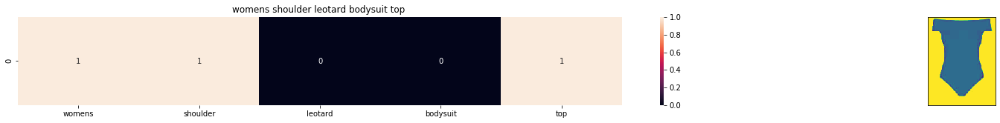

ASIN : B00TZVW8YG
Brand: Fasion 4 Less
Title: womens shoulder leotard bodysuit top 
Euclidean similarity with the query image : 3.1622776601683795


In [19]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(12000, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.


## TF-IDF based product similarity

In [20]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

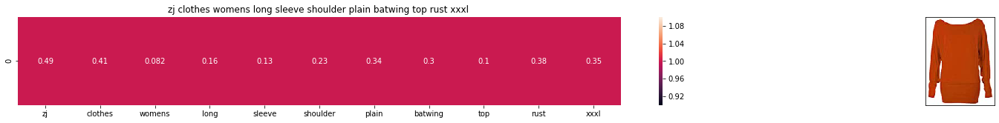

ASIN : B017N15BHK
BRAND : ZJ Clothes
Eucliden distance from the given image : 0.0


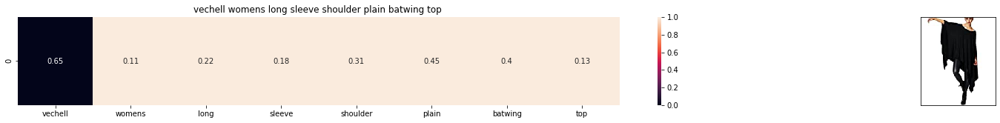

ASIN : B017B3H7W2
BRAND : Hot Hanger
Eucliden distance from the given image : 1.0663629433773372


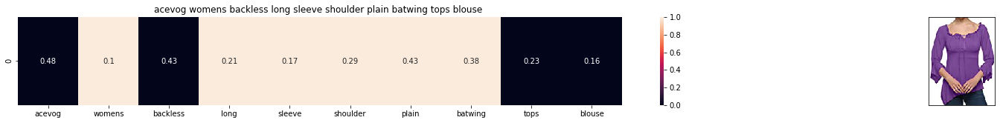

ASIN : B01CE4GMGU
BRAND : ACEVOG
Eucliden distance from the given image : 1.1003633806093847


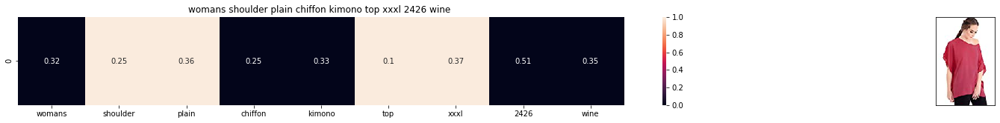

ASIN : B075618RZB
BRAND : R KON
Eucliden distance from the given image : 1.1651478027610118


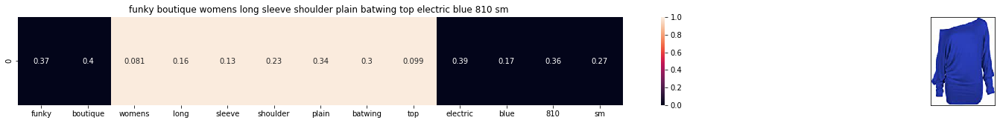

ASIN : B009FV8I9K
BRAND : Hot Hanger
Eucliden distance from the given image : 1.1660329427929972


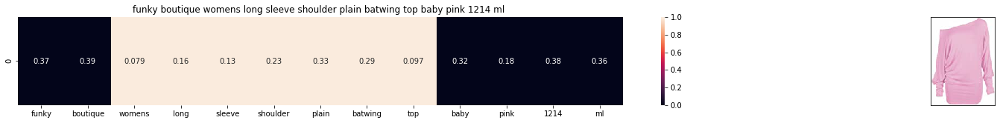

ASIN : B009FV8R7I
BRAND : Hot Hanger
Eucliden distance from the given image : 1.1710461449096048


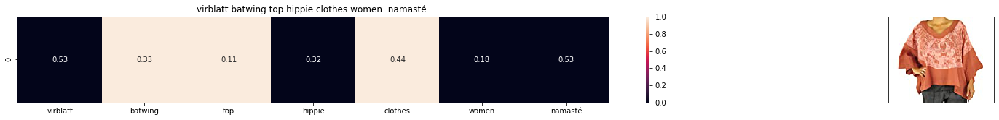

ASIN : B01F4U0ROO
BRAND : virblatt
Eucliden distance from the given image : 1.1935155584907389


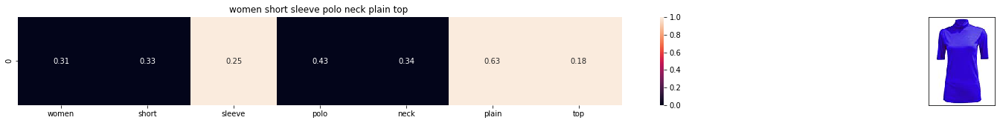

ASIN : B01M4GF99L
BRAND : ApplesBottom
Eucliden distance from the given image : 1.2133747463472544


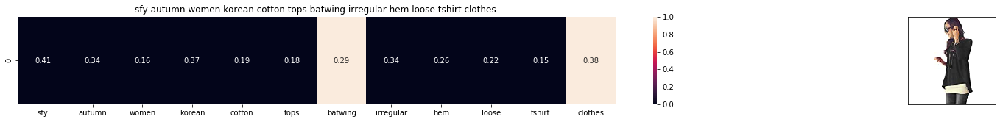

ASIN : B01M8ICKJQ
BRAND : SoForYou
Eucliden distance from the given image : 1.230218788299862


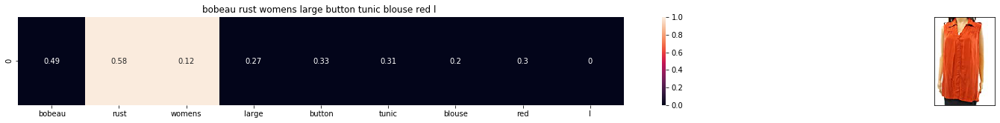

ASIN : B072FP1GBV
BRAND : Bobeau
Eucliden distance from the given image : 1.239419226434854


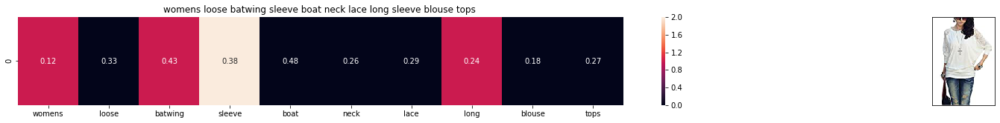

ASIN : B00Y0MPHM0
BRAND : YL
Eucliden distance from the given image : 1.2397453436374943


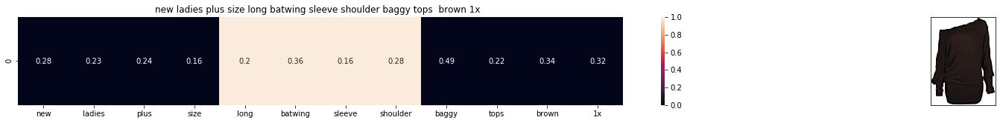

ASIN : B00MJPVIDW
BRAND : Xclusive Collection
Eucliden distance from the given image : 1.2413963373511943


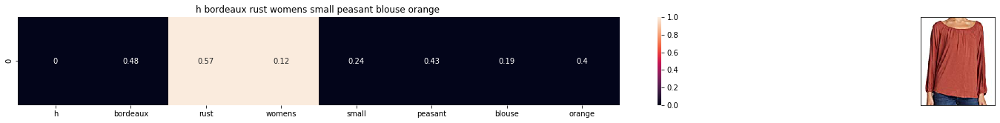

ASIN : B074PYWY47
BRAND : H By Bordeaux
Eucliden distance from the given image : 1.2432327555812521


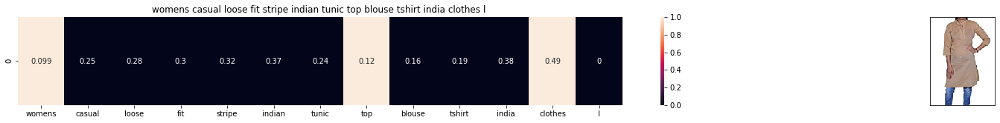

ASIN : B01HGQNILI
BRAND : RoyaltyLane
Eucliden distance from the given image : 1.2492701301712166


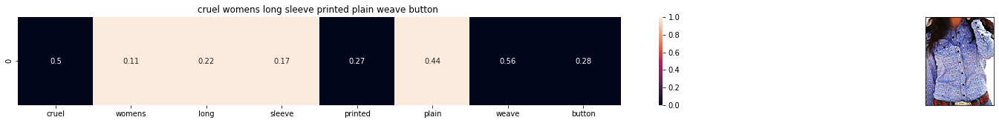

ASIN : B00TQ3XY8C
BRAND : Cruel
Eucliden distance from the given image : 1.2507401300430843


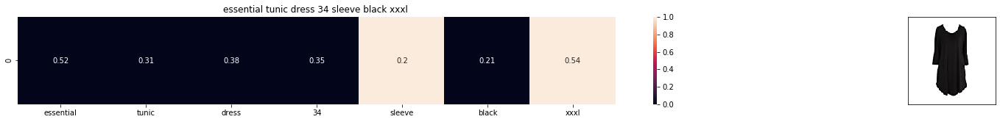

ASIN : B074P6LPRM
BRAND : Mountain Mamas
Eucliden distance from the given image : 1.2510598446972818


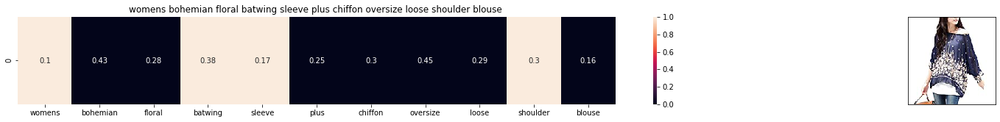

ASIN : B00YCA1YFY
BRAND : Display Promotion
Eucliden distance from the given image : 1.2511097301286396


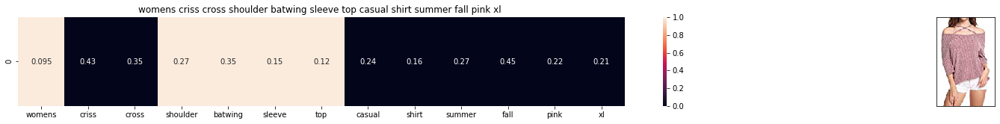

ASIN : B071G2C4ZC
BRAND : JQstar
Eucliden distance from the given image : 1.2569503958214021


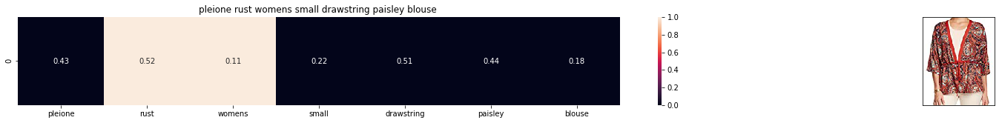

ASIN : B01IHRN7IY
BRAND : Pleione
Eucliden distance from the given image : 1.2580715265198095


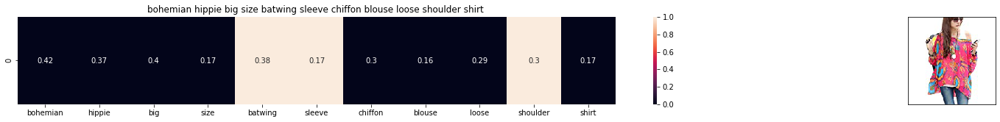

ASIN : B00YC92VRU
BRAND : Display Promotion
Eucliden distance from the given image : 1.2586230708986768


In [21]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(12000, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

## IDF based product similarity

In [26]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [27]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [28]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # it will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

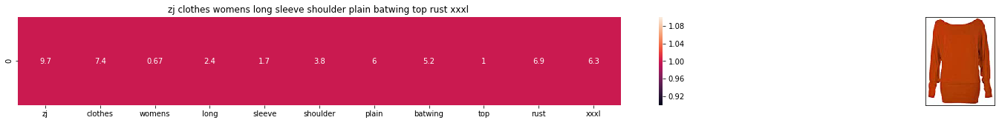

ASIN : B017N15BHK
Brand : ZJ Clothes
euclidean distance from the given image : 0.0


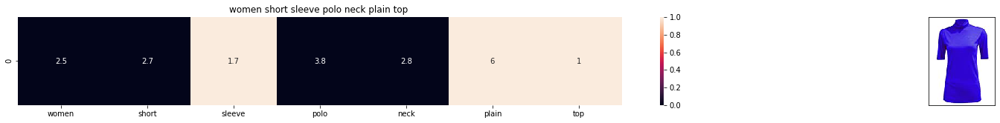

ASIN : B01M4GF99L
Brand : ApplesBottom
euclidean distance from the given image : 17.86140346669886


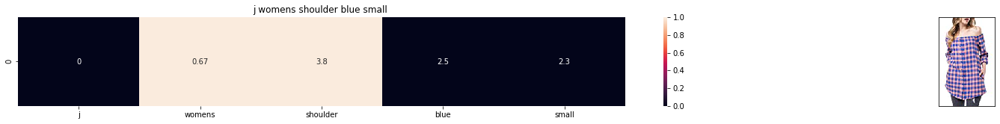

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 17.885402931396754


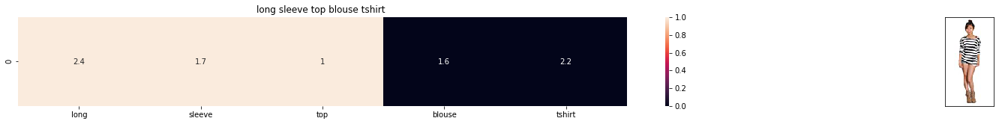

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 17.91376224335112


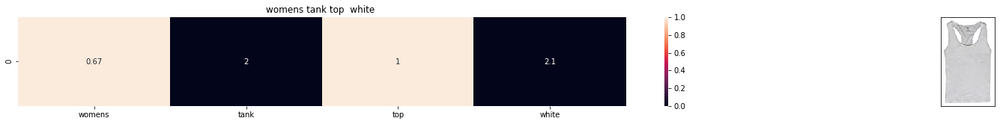

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 18.157265590726592


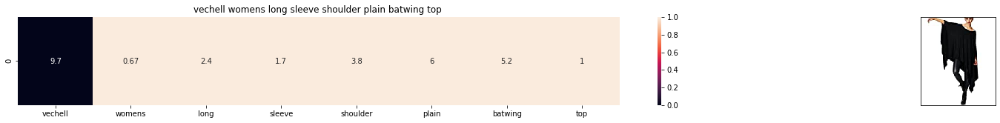

ASIN : B017B3H7W2
Brand : Hot Hanger
euclidean distance from the given image : 18.162744679367403


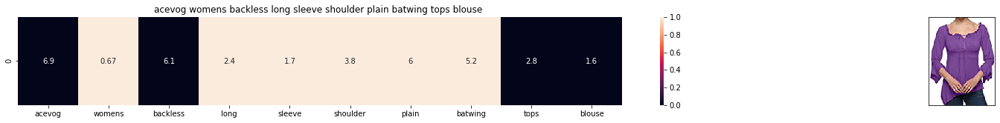

ASIN : B01CE4GMGU
Brand : ACEVOG
euclidean distance from the given image : 18.23728091957458


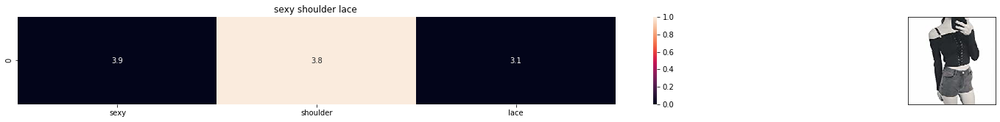

ASIN : B01JVWUB3S
Brand : bylexie
euclidean distance from the given image : 18.252970922216324


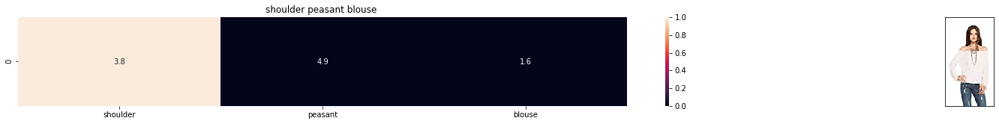

ASIN : B01E1QD5PK
Brand : CHASER
euclidean distance from the given image : 18.30392166740632


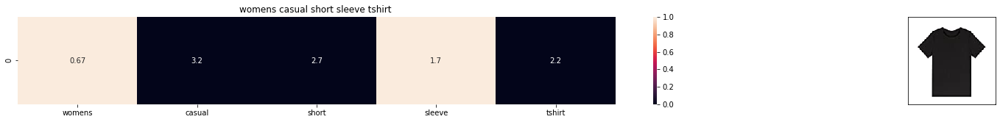

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 18.48964100000082


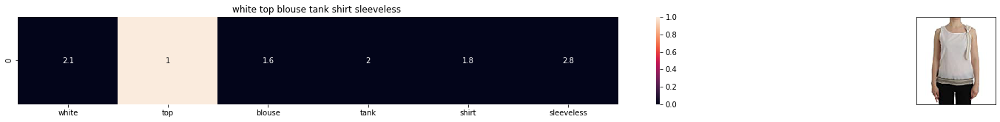

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 18.547949044817983


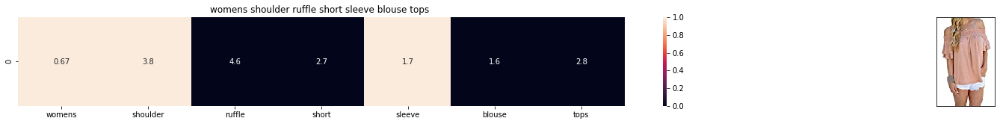

ASIN : B01KXEE20Q
Brand : ouwoow
euclidean distance from the given image : 18.555941248748898


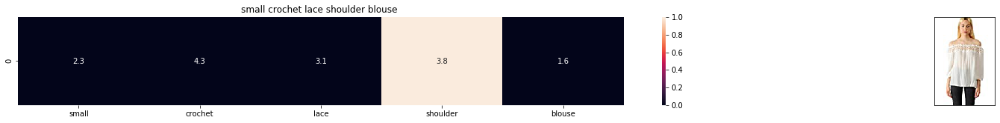

ASIN : B01N7WS5C9
Brand : Girl Evolution
euclidean distance from the given image : 18.567725664125916


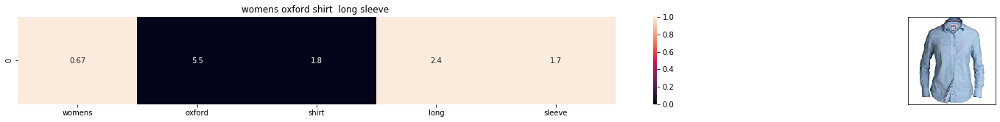

ASIN : B01577JZOC
Brand : Boast
euclidean distance from the given image : 18.63464389453234


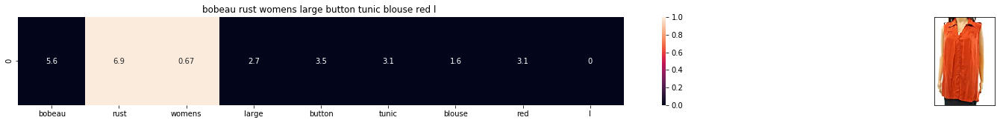

ASIN : B072FP1GBV
Brand : Bobeau
euclidean distance from the given image : 18.653874324897384


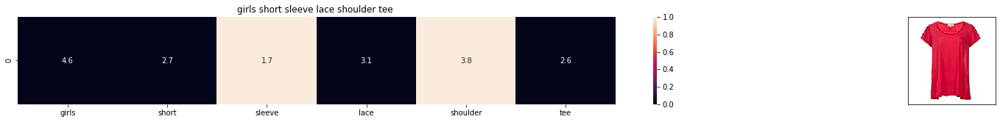

ASIN : B074H47ZBD
Brand : Joyce Clapham
euclidean distance from the given image : 18.720823688769737


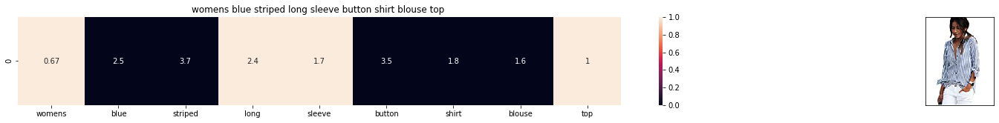

ASIN : B01KM2OLIW
Brand : Voguegirl
euclidean distance from the given image : 18.728672524498982


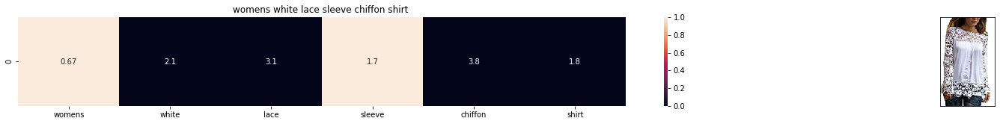

ASIN : B073JWSM1V
Brand : Fuming
euclidean distance from the given image : 18.746370063550643


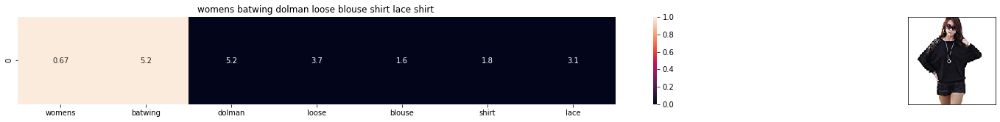

ASIN : B00OUENQ1W
Brand : Huawen
euclidean distance from the given image : 18.748156620750635


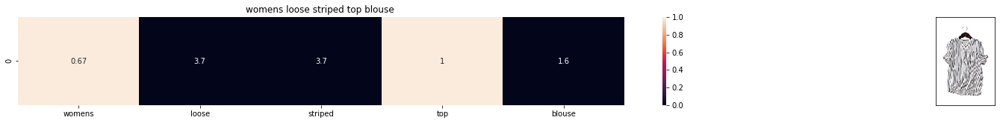

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
euclidean distance from the given image : 18.751990249361963


In [29]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(12000,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# Text Semantics based product similarity

In [30]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle


with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [31]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [32]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

###  Average Word2Vec product similarity.

In [33]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


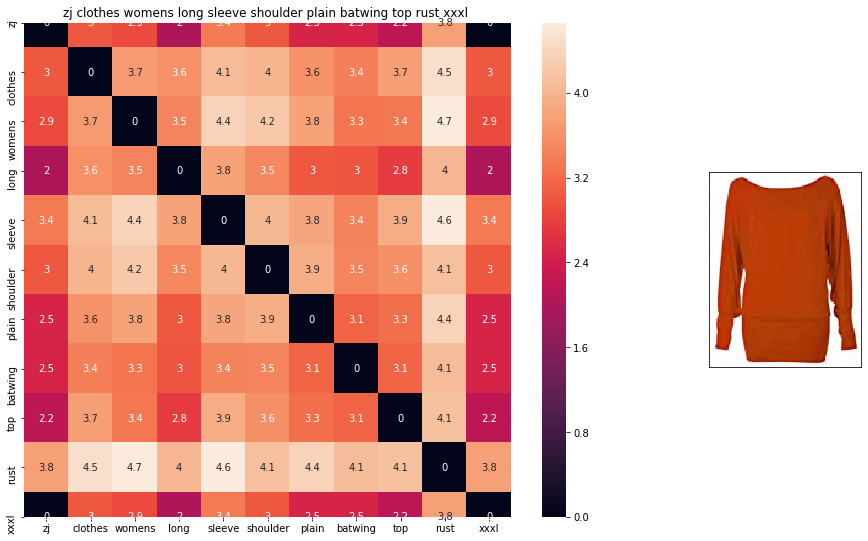

ASIN : B017N15BHK
BRAND : ZJ Clothes
euclidean distance from given input image : 0.0


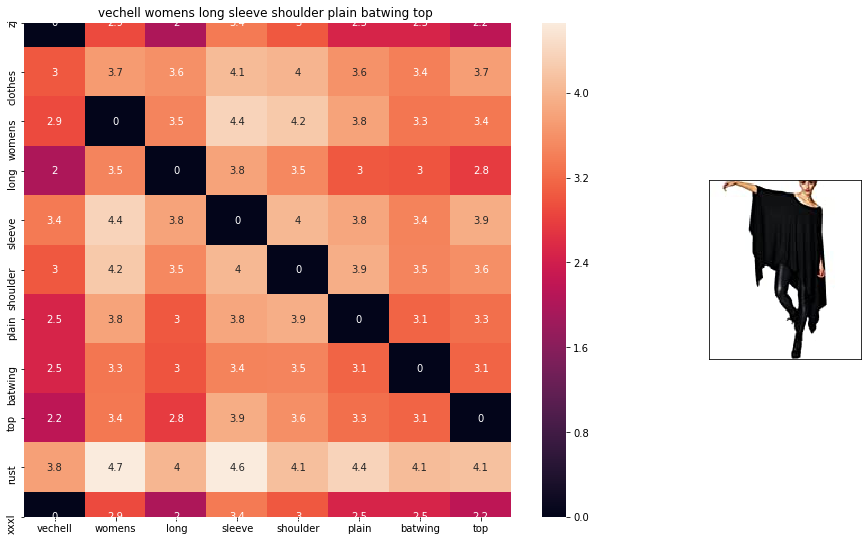

ASIN : B017B3H7W2
BRAND : Hot Hanger
euclidean distance from given input image : 0.45103312


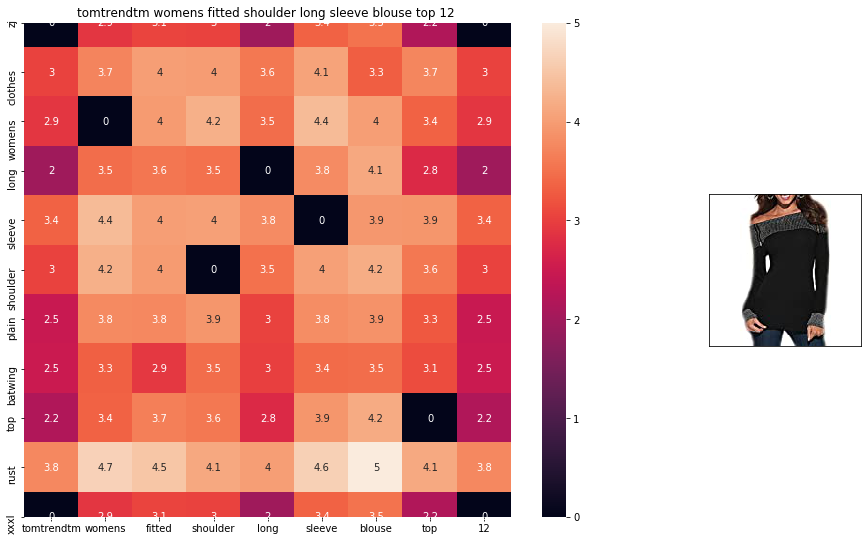

ASIN : B01A5MR31G
BRAND : Tom_trend
euclidean distance from given input image : 0.600531


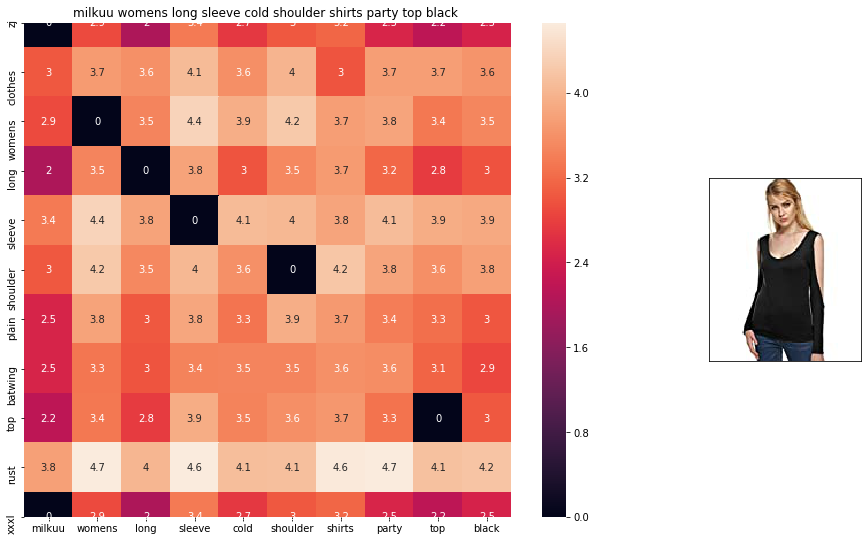

ASIN : B01I2WW7NK
BRAND : Milkuu
euclidean distance from given input image : 0.63952976


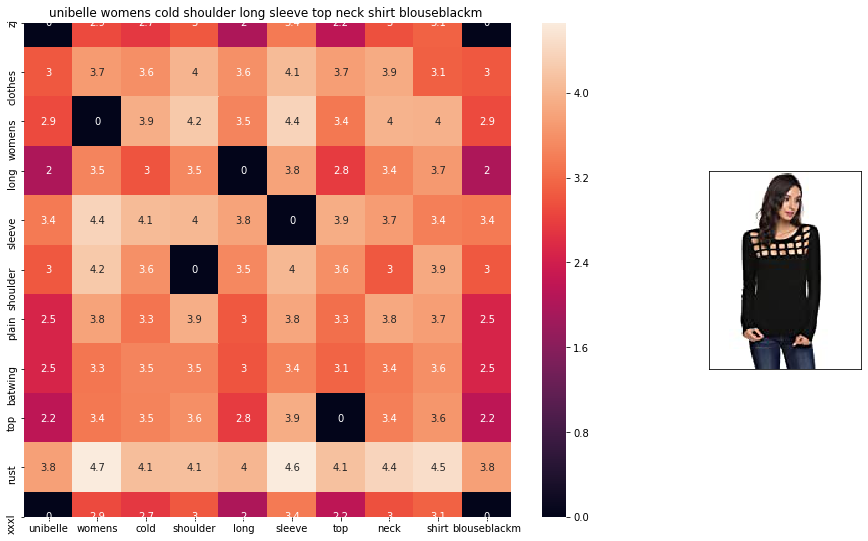

ASIN : B074PSMG35
BRAND : Beautyuu
euclidean distance from given input image : 0.6435279


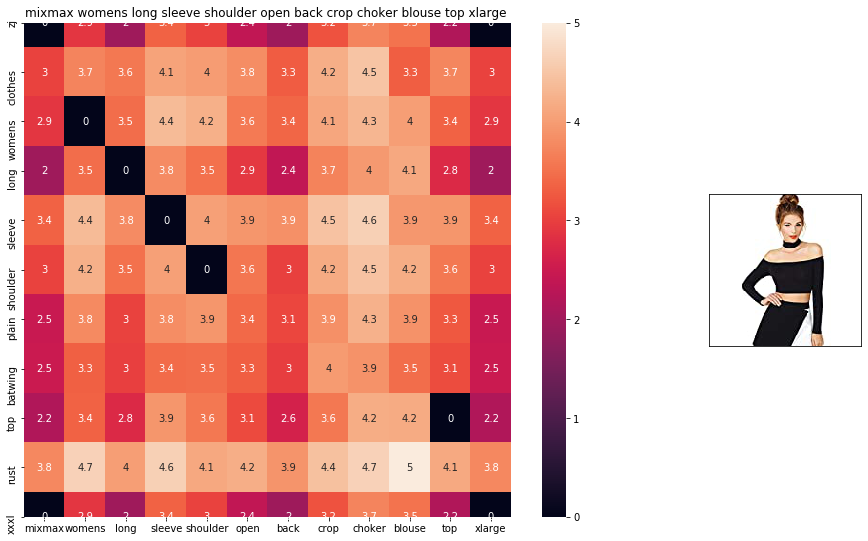

ASIN : B01D30ABJI
BRAND : Mixmax
euclidean distance from given input image : 0.658716


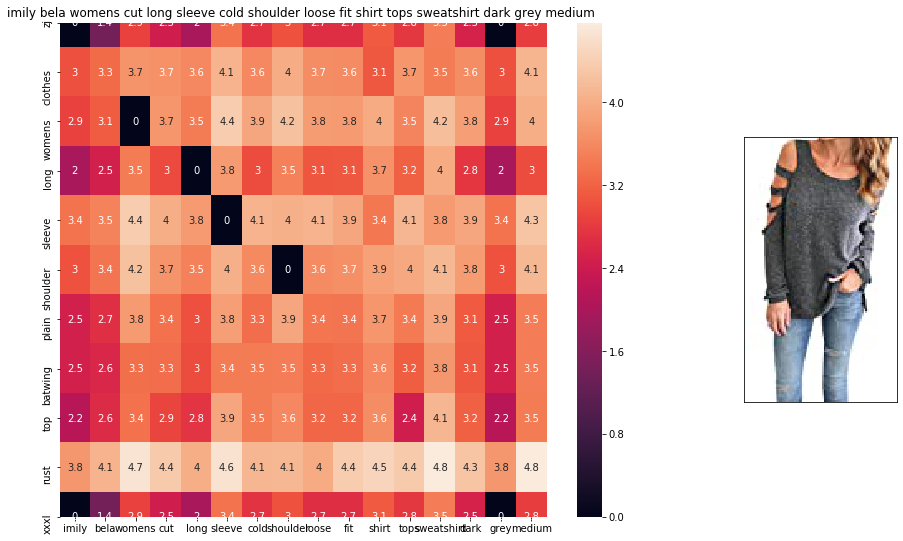

ASIN : B01N5Y46Q6
BRAND : Imily Bela
euclidean distance from given input image : 0.6647027


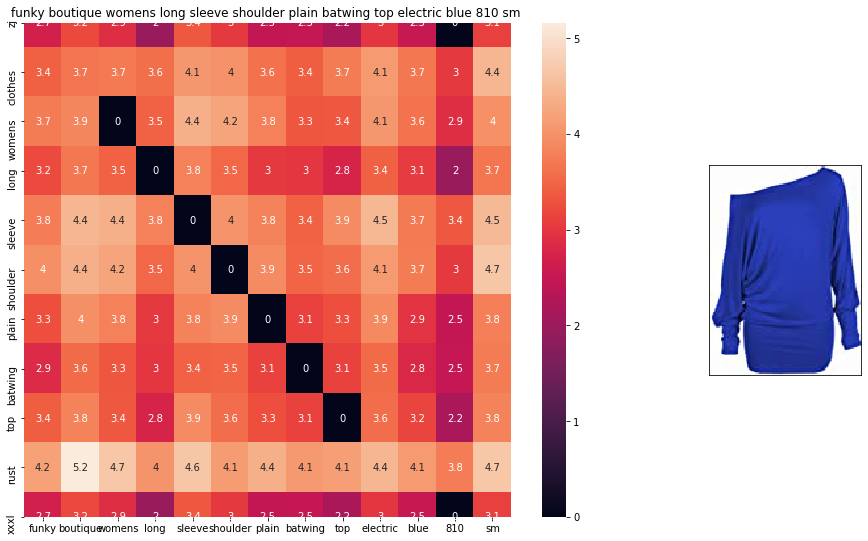

ASIN : B009FV8I9K
BRAND : Hot Hanger
euclidean distance from given input image : 0.66763794


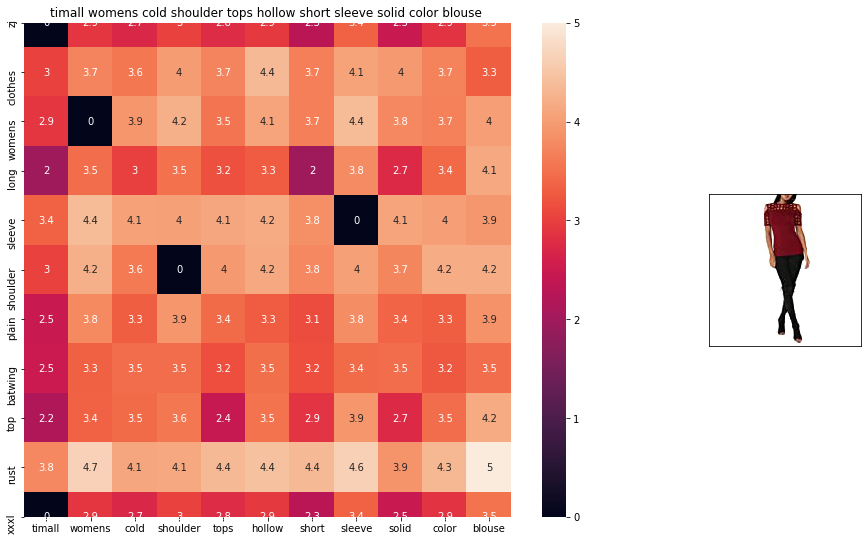

ASIN : B06XJ2MXJG
BRAND : Timall
euclidean distance from given input image : 0.6699635


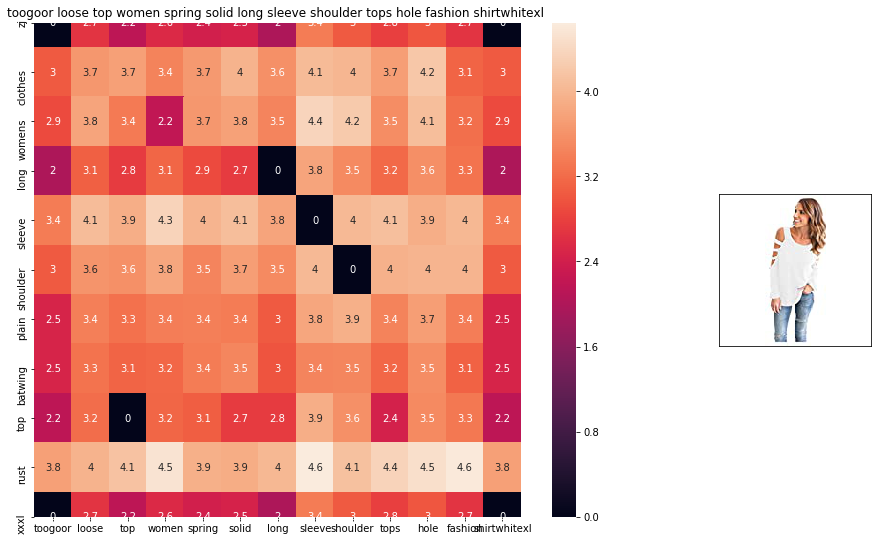

ASIN : B073NXF4ZB
BRAND : TOOGOO(R)
euclidean distance from given input image : 0.66997385


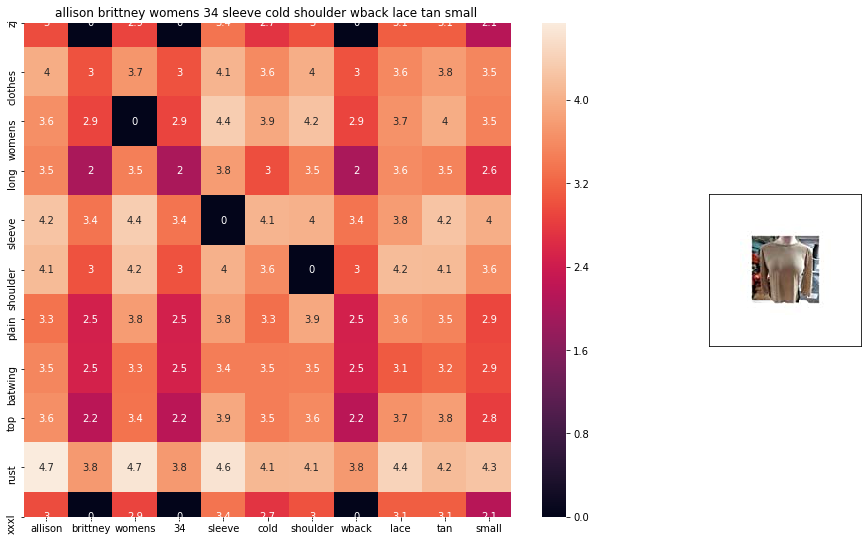

ASIN : B071YCPGXR
BRAND : Allison Brittney
euclidean distance from given input image : 0.6726205


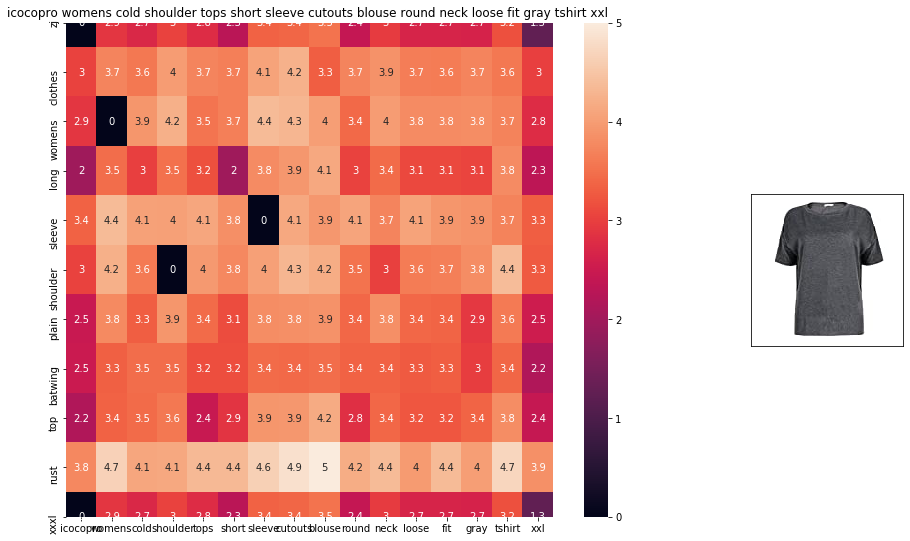

ASIN : B072C72MB5
BRAND : ICOCOPRO
euclidean distance from given input image : 0.6754641


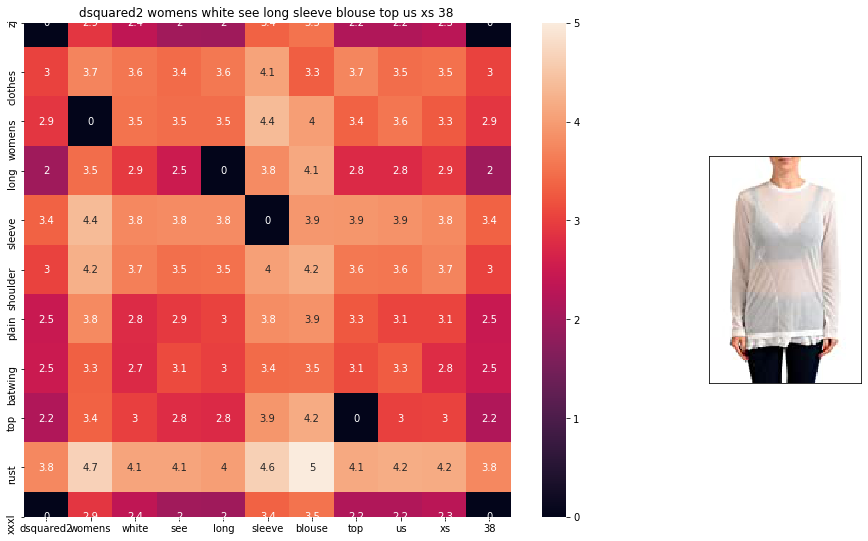

ASIN : B07462YBNY
BRAND : DSQUARED2
euclidean distance from given input image : 0.6849328


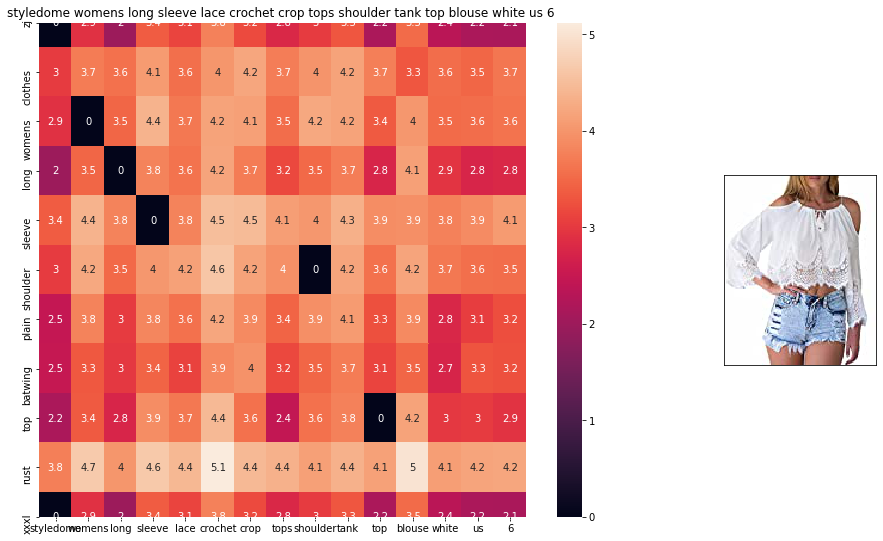

ASIN : B06WLLV8G3
BRAND : StyleDome
euclidean distance from given input image : 0.68637896


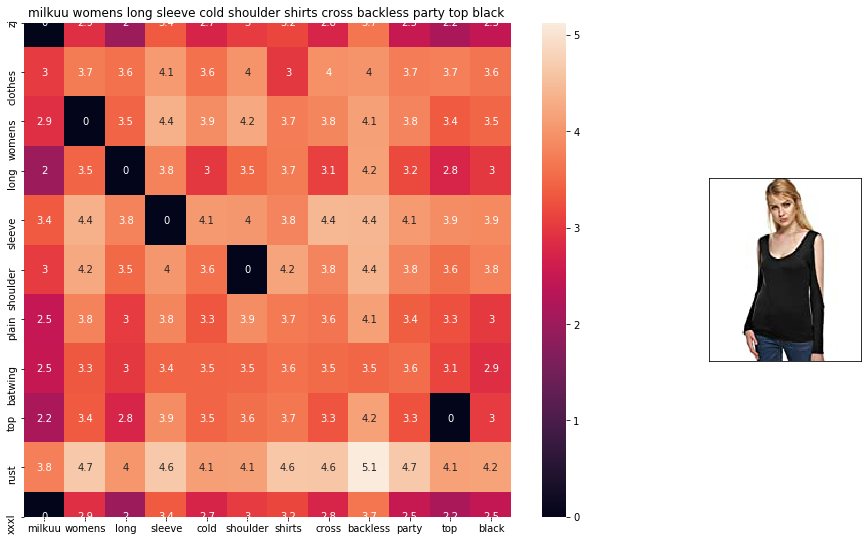

ASIN : B01I2WW6PE
BRAND : Milkuu
euclidean distance from given input image : 0.6869067


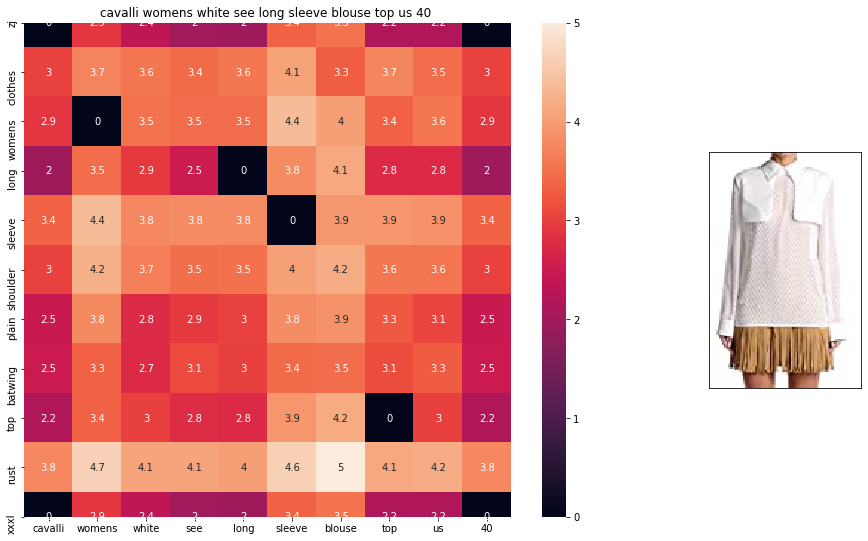

ASIN : B01FZTK0D2
BRAND : Just Cavalli
euclidean distance from given input image : 0.6904137


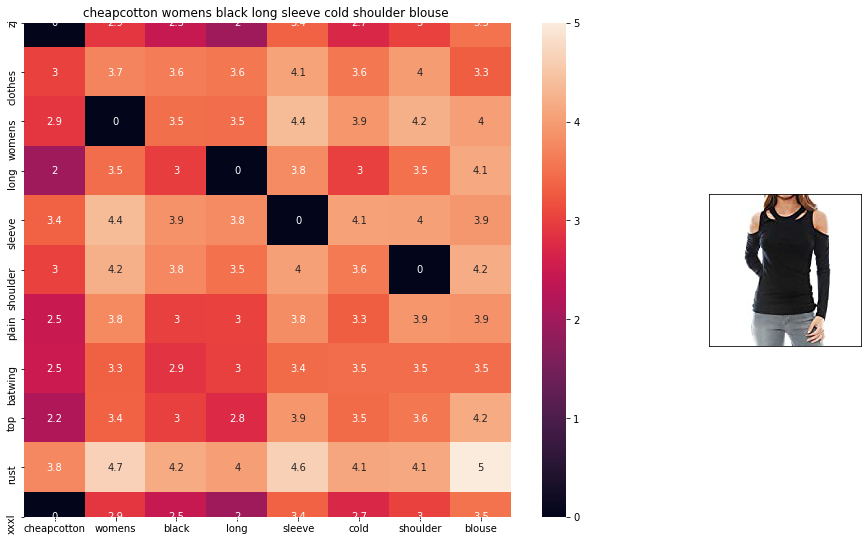

ASIN : B00Q2ZDJLO
BRAND : Cheapcotton
euclidean distance from given input image : 0.6943692


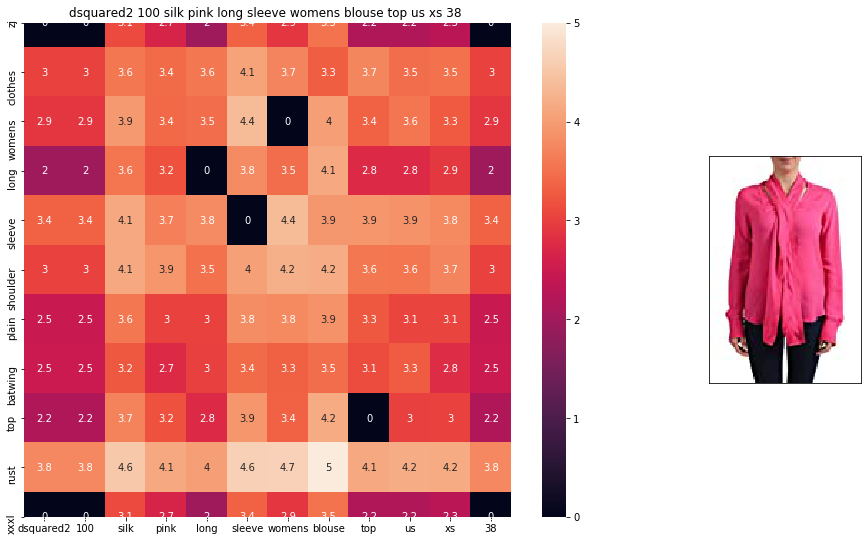

ASIN : B01M087PQ5
BRAND : DSQUARED2
euclidean distance from given input image : 0.6951742


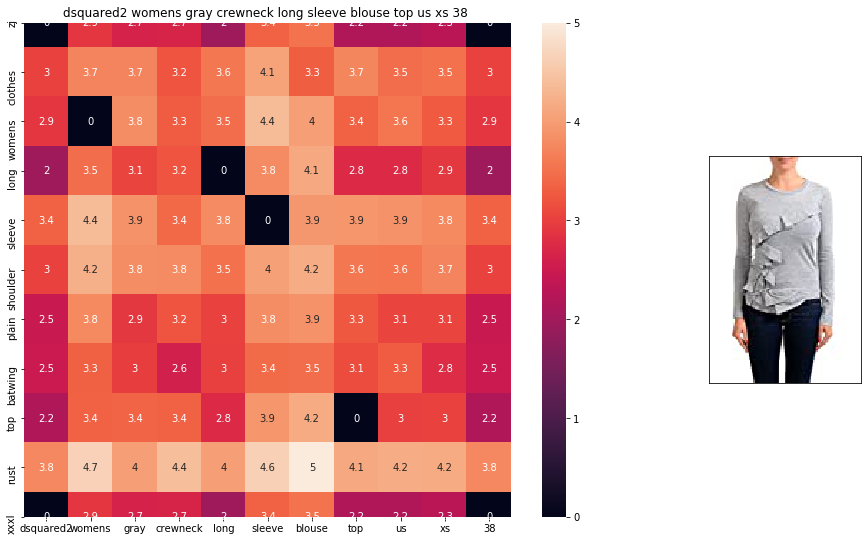

ASIN : B074643RZG
BRAND : DSQUARED2
euclidean distance from given input image : 0.69592184


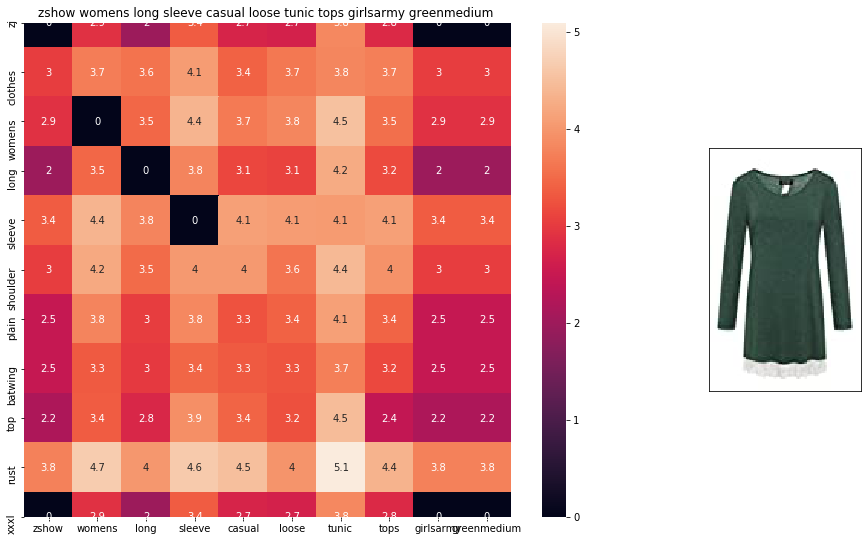

ASIN : B071NTKYPG
BRAND : ZSHOW
euclidean distance from given input image : 0.69781643


In [34]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12000, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

###   IDF weighted Word2Vec for product similarity

In [35]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

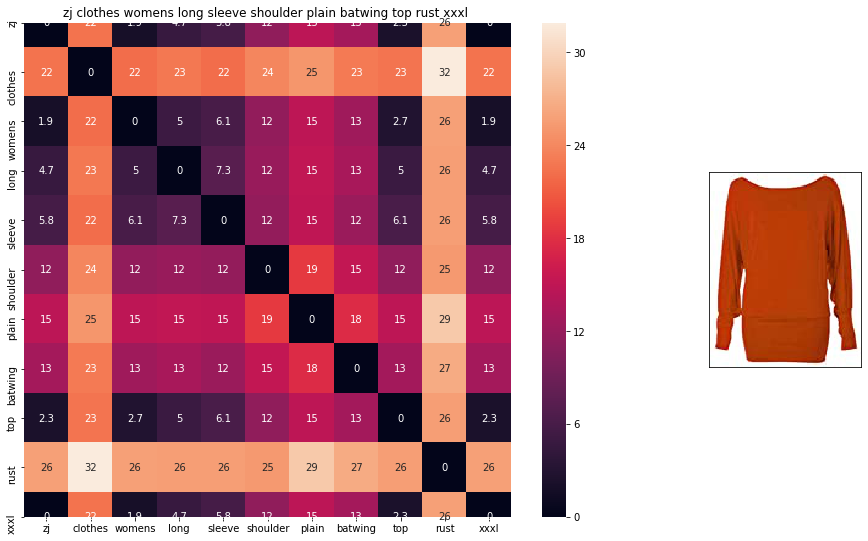

ASIN : B017N15BHK
Brand : ZJ Clothes
euclidean distance from input : 0.0


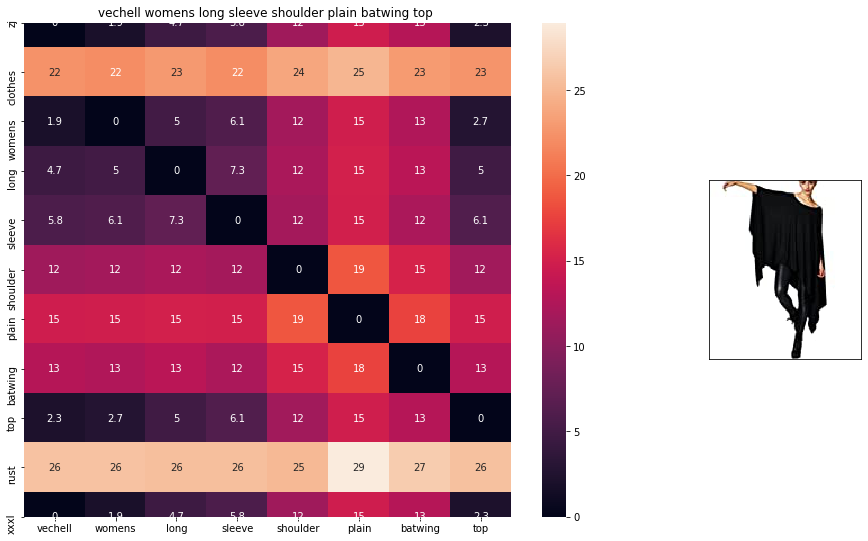

ASIN : B017B3H7W2
Brand : Hot Hanger
euclidean distance from input : 3.073128


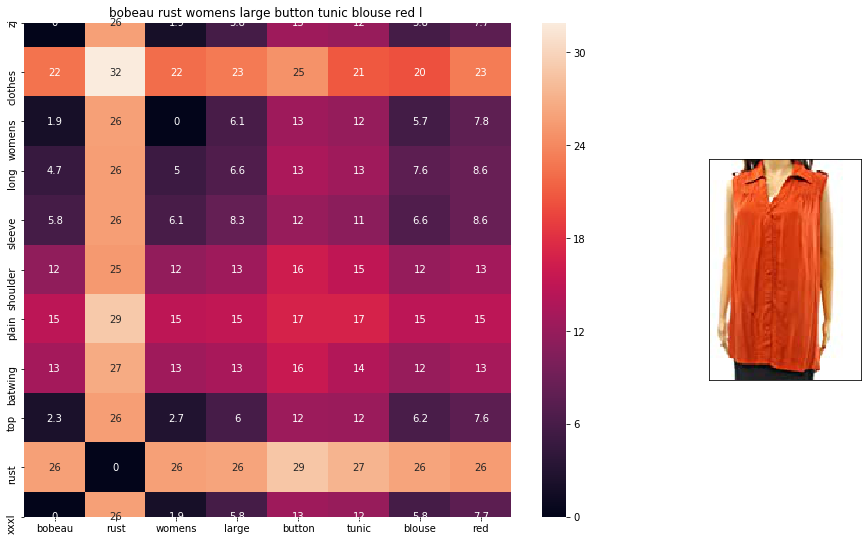

ASIN : B072FP1GBV
Brand : Bobeau
euclidean distance from input : 3.1369452


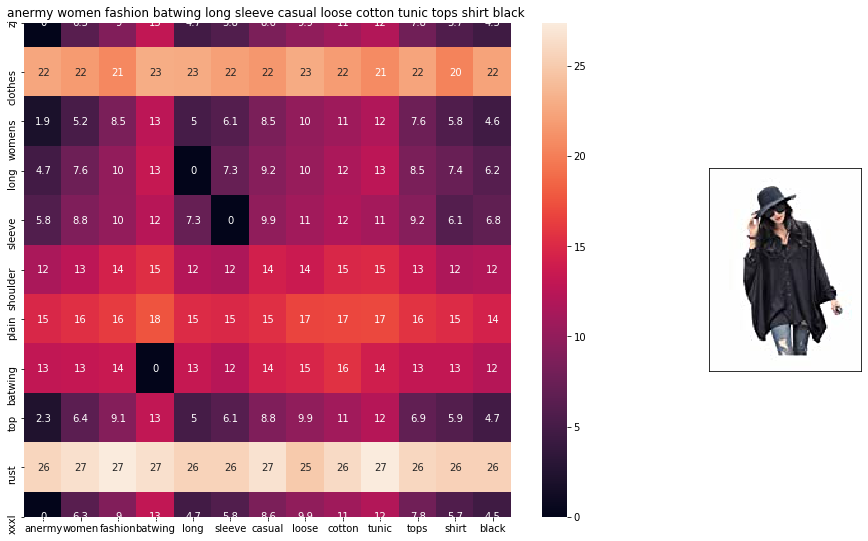

ASIN : B01A6IZM6C
Brand : Anermy
euclidean distance from input : 3.4364324


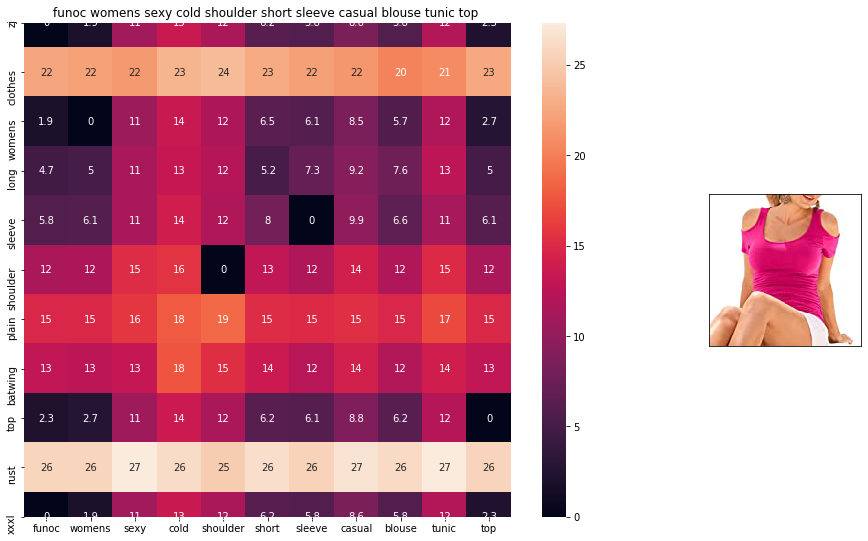

ASIN : B01KHJU4Q8
Brand : FUNOC
euclidean distance from input : 3.4628956


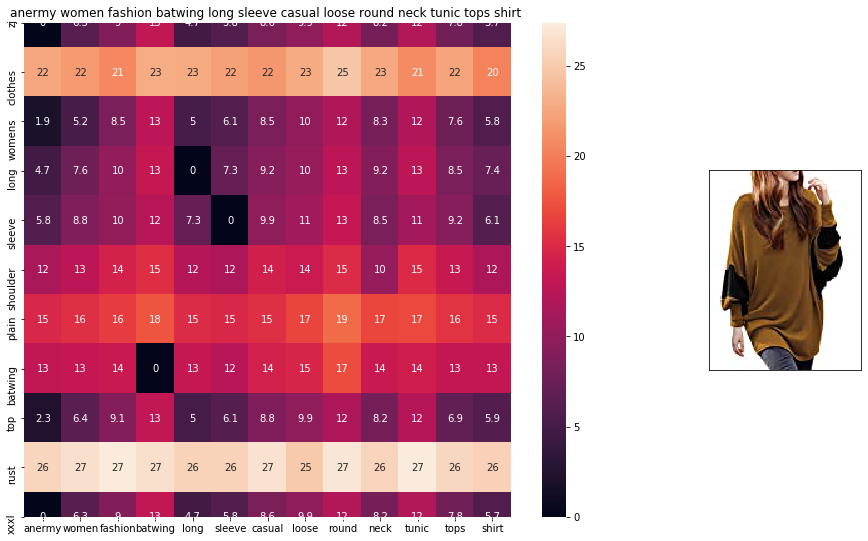

ASIN : B01A6CZMM2
Brand : Anermy
euclidean distance from input : 3.4746182


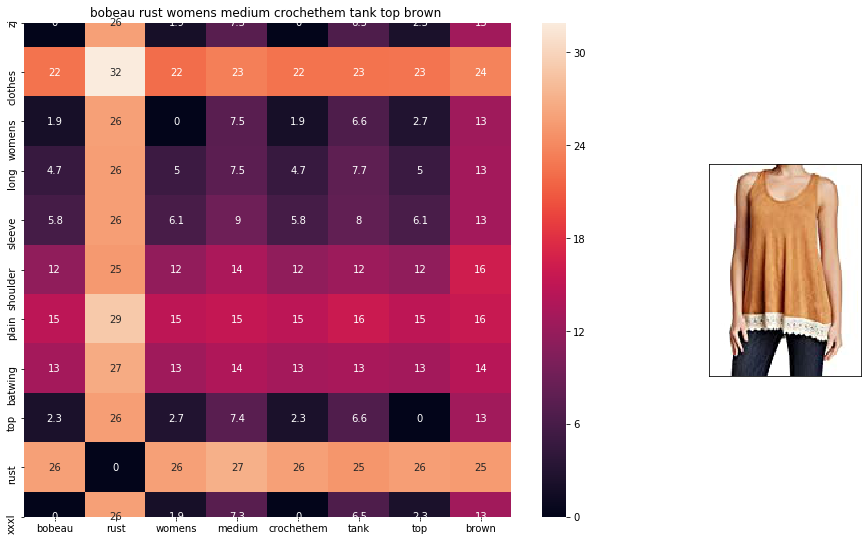

ASIN : B01MS8FD79
Brand : Bobeau
euclidean distance from input : 3.4898684


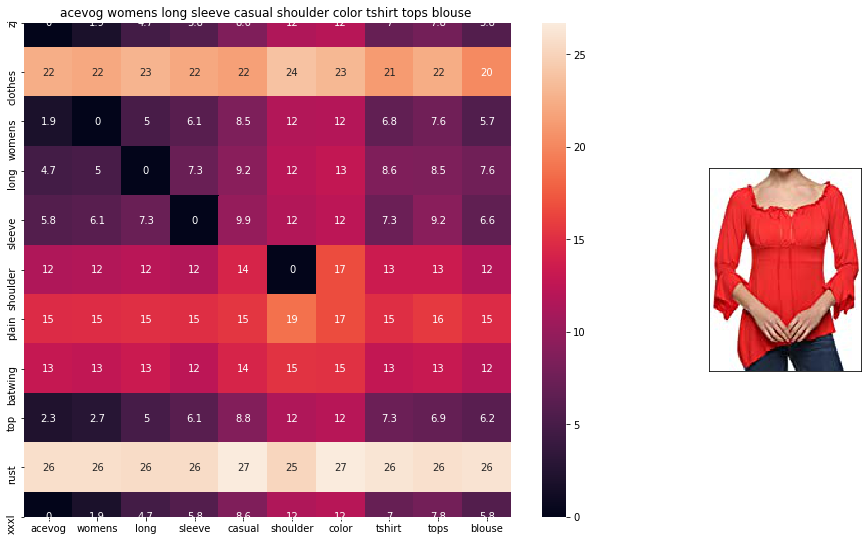

ASIN : B01CE4GI78
Brand : ACEVOG
euclidean distance from input : 3.5045161


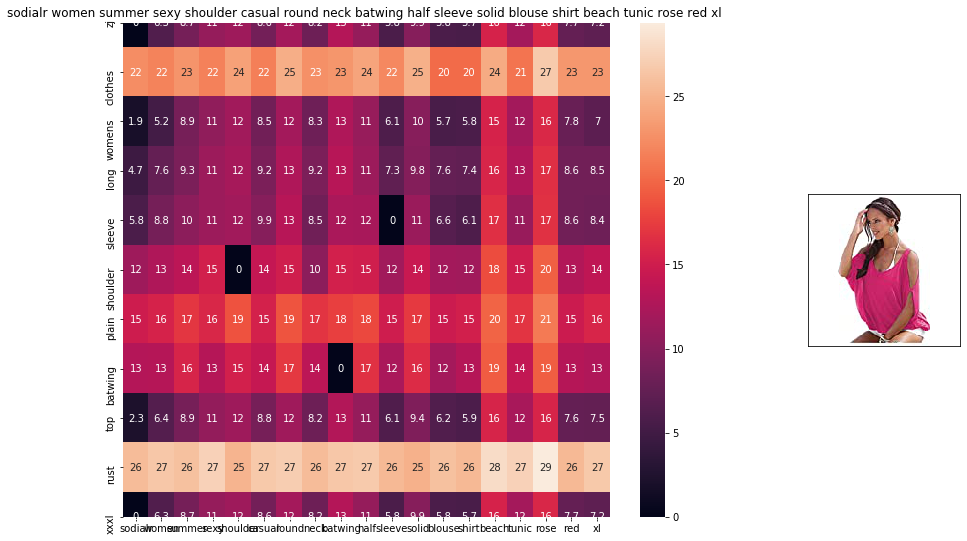

ASIN : B073WCC952
Brand : SODIAL(R)
euclidean distance from input : 3.524785


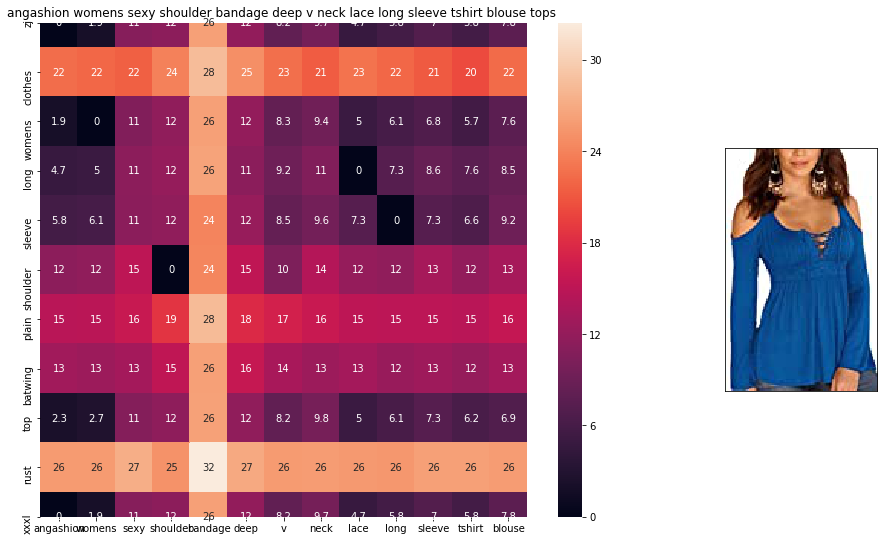

ASIN : B01MYLZLZ8
Brand : Angashion
euclidean distance from input : 3.5471606


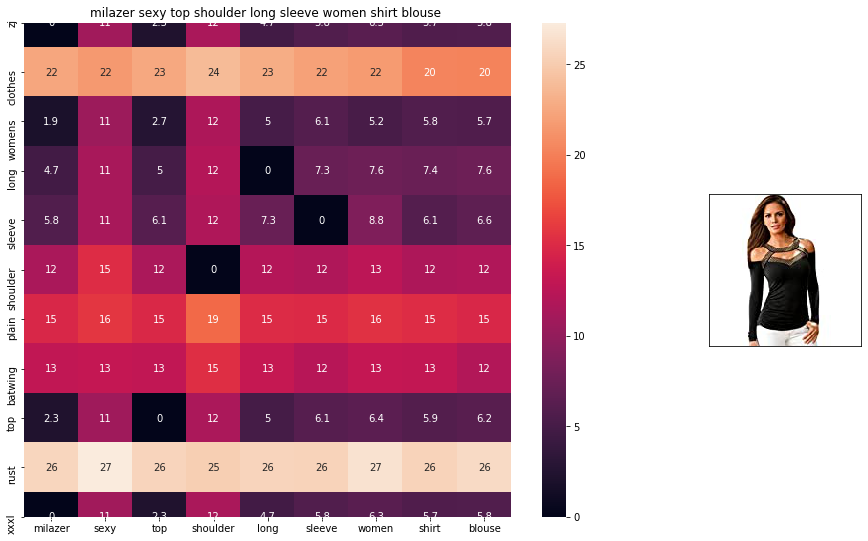

ASIN : B01MXMI7D1
Brand : Milazer
euclidean distance from input : 3.554668


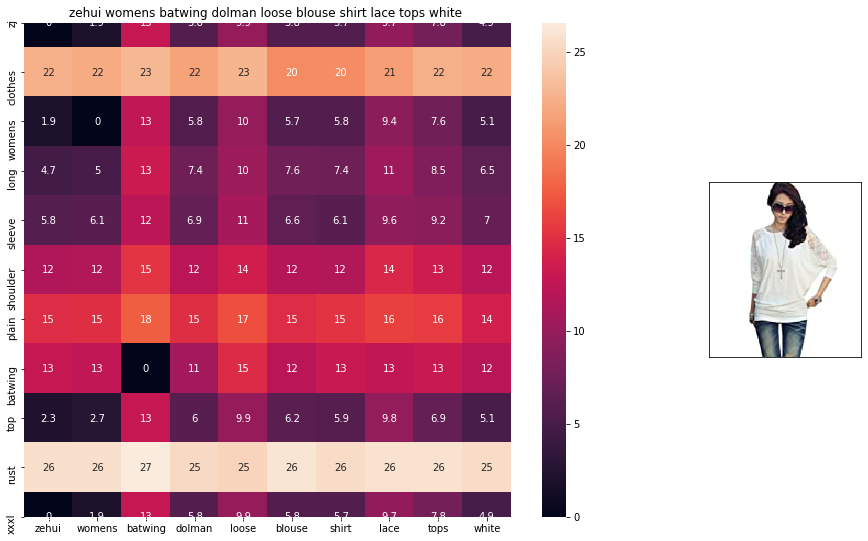

ASIN : B00CII5ZXE
Brand : Zehui
euclidean distance from input : 3.5651605


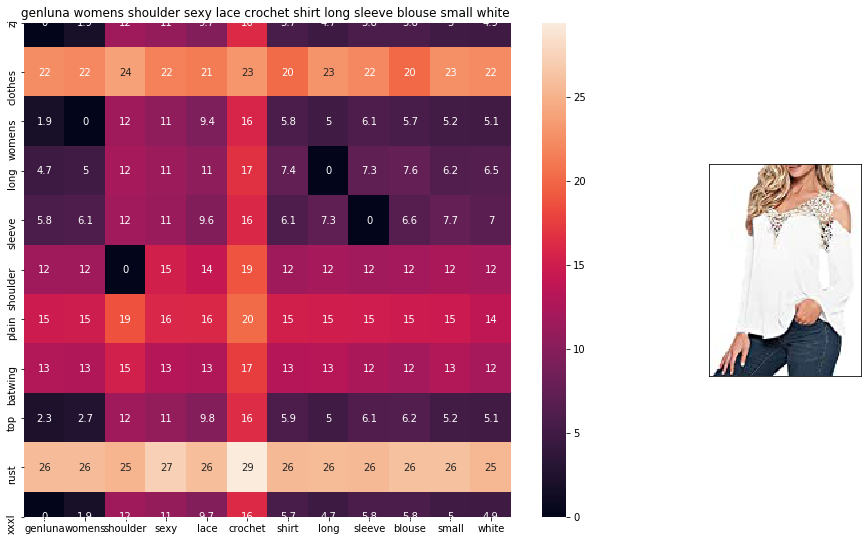

ASIN : B01LZRBG03
Brand : Genluna
euclidean distance from input : 3.5707722


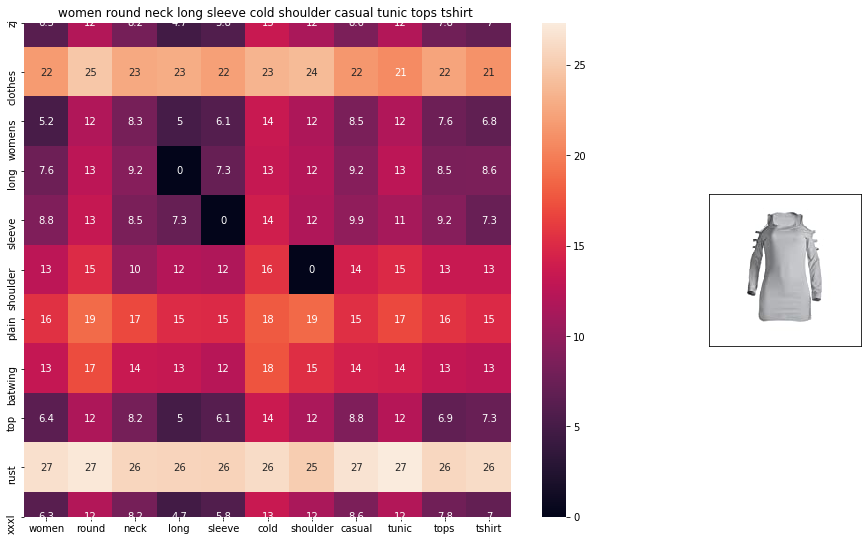

ASIN : B0753XR2HQ
Brand : YF
euclidean distance from input : 3.5724356


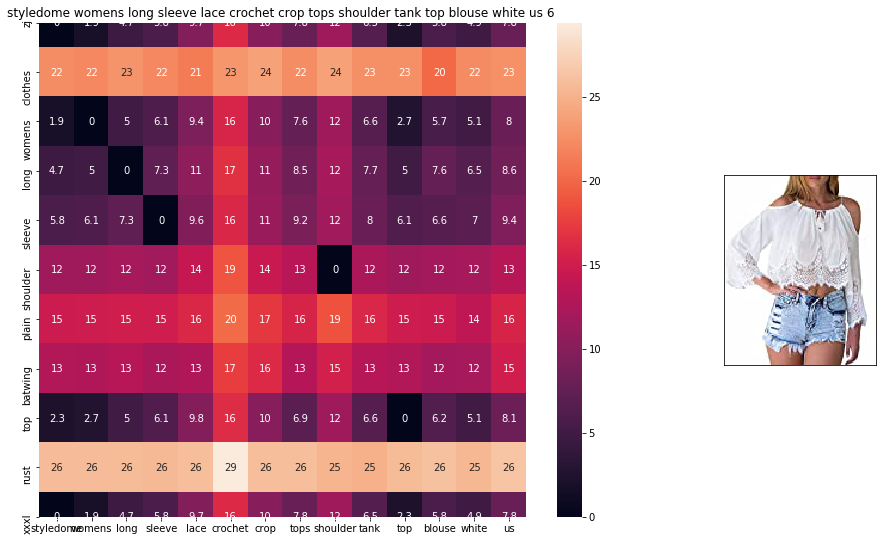

ASIN : B06WLLV8G3
Brand : StyleDome
euclidean distance from input : 3.5827444


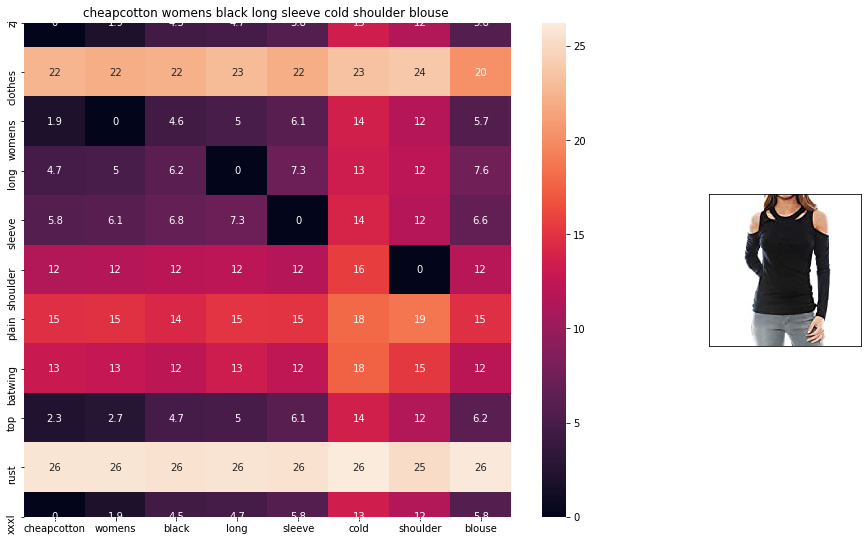

ASIN : B00Q2ZDJLO
Brand : Cheapcotton
euclidean distance from input : 3.5837703


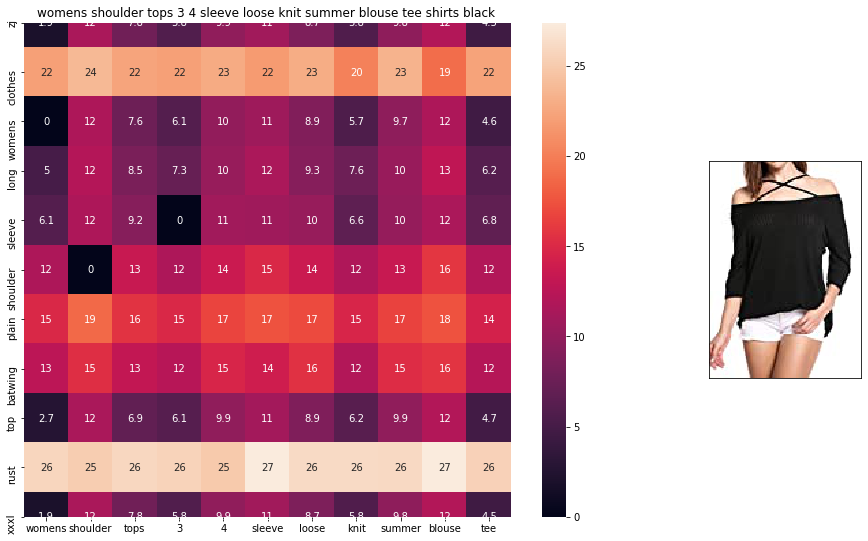

ASIN : B071G2C7Q4
Brand : JQstar
euclidean distance from input : 3.5877163


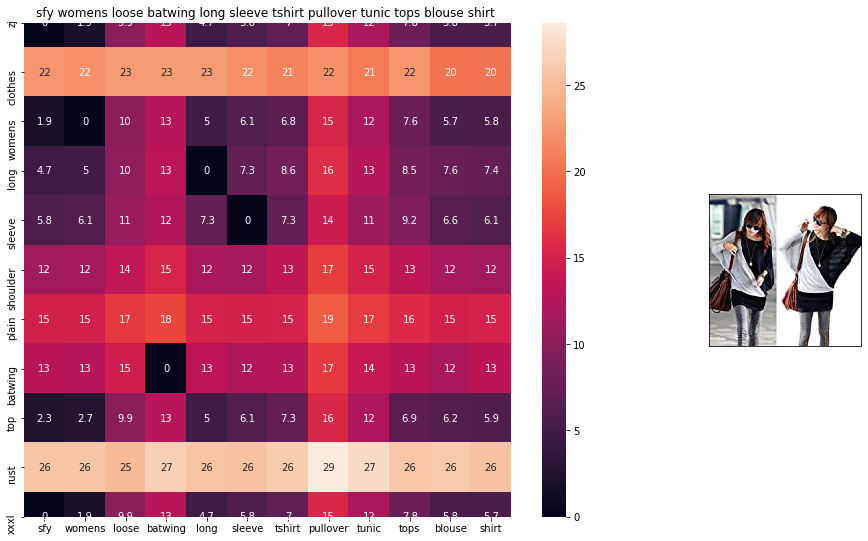

ASIN : B01MTU9XTE
Brand : SoForYou
euclidean distance from input : 3.5891984


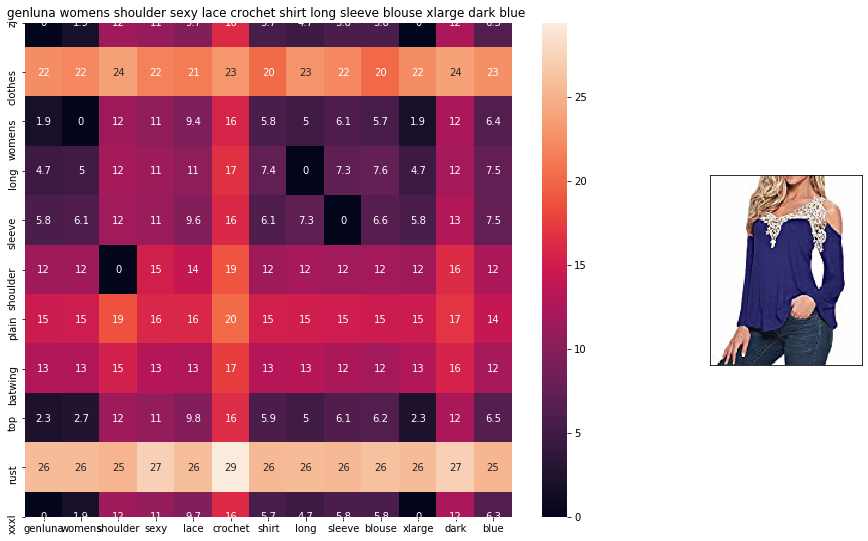

ASIN : B01LZRBE5K
Brand : Genluna
euclidean distance from input : 3.6016073


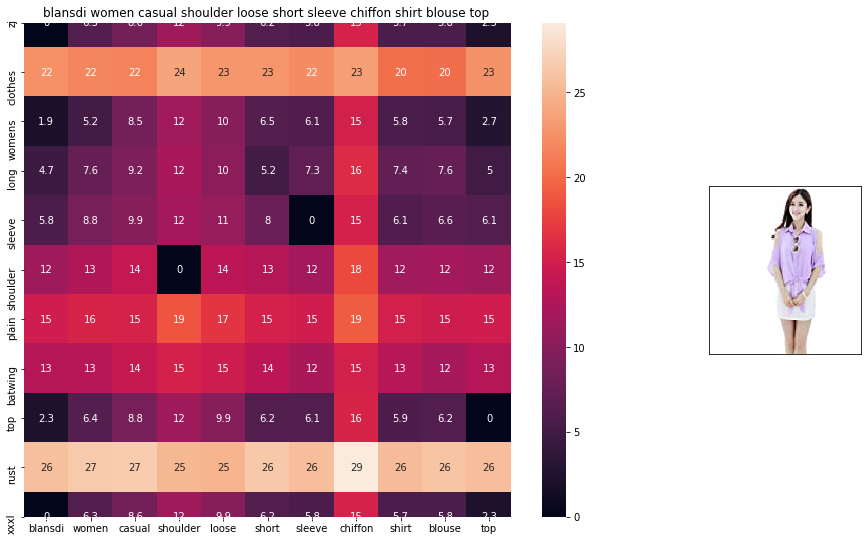

ASIN : B01AY1280E
Brand : Blansdi
euclidean distance from input : 3.6301534


In [36]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12000, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### Weighted similarity using brand and color.

In [37]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [38]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

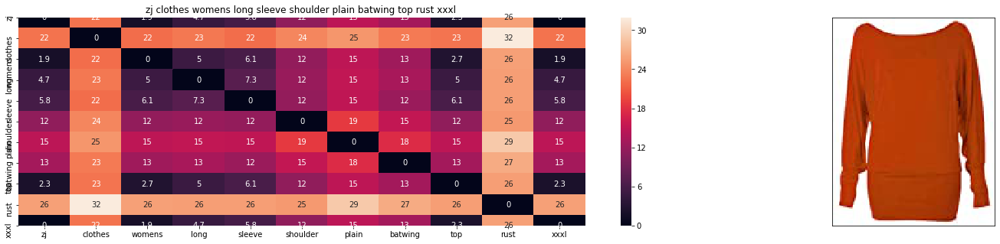

ASIN : B017N15BHK
Brand : ZJ Clothes
euclidean distance from input : 0.0


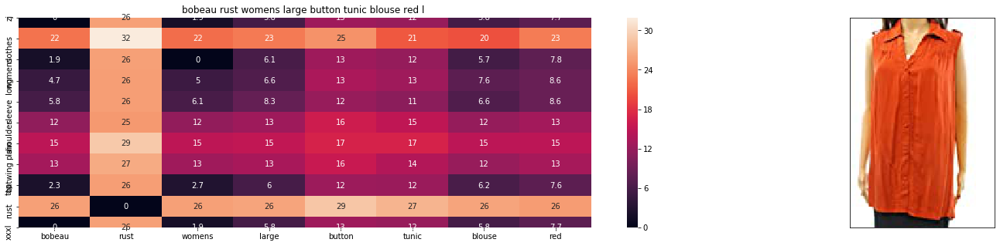

ASIN : B072FP1GBV
Brand : Bobeau
euclidean distance from input : 2.686506660258684


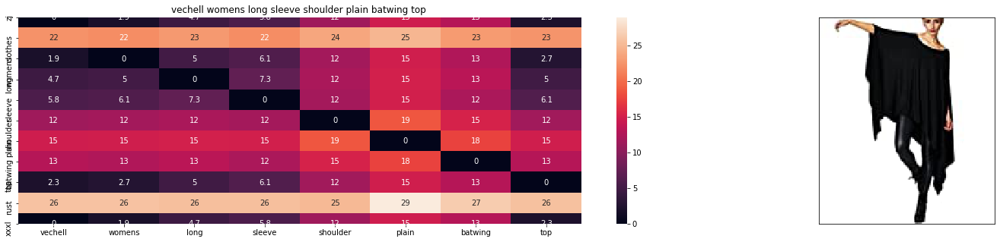

ASIN : B017B3H7W2
Brand : Hot Hanger
euclidean distance from input : 2.7613088400500363


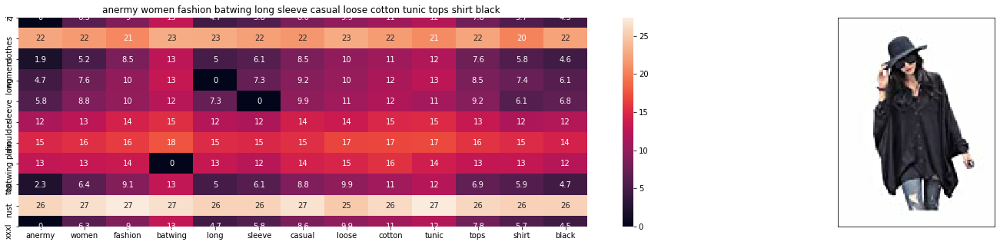

ASIN : B01A6IZM6C
Brand : Anermy
euclidean distance from input : 2.836250121867571


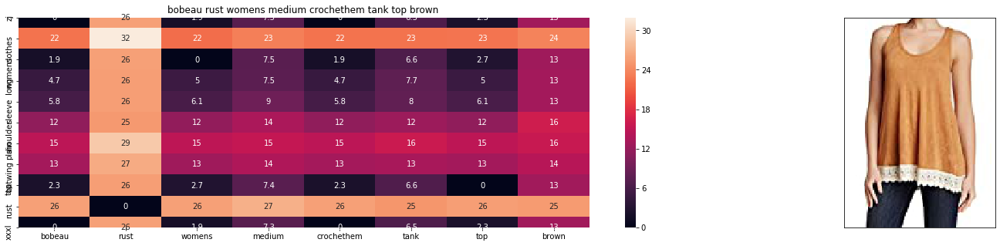

ASIN : B01MS8FD79
Brand : Bobeau
euclidean distance from input : 2.8629682615160084


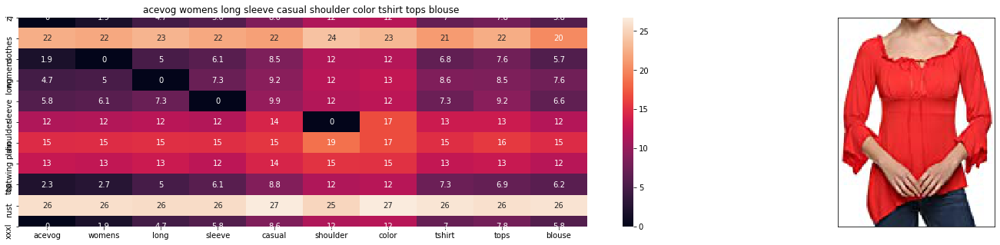

ASIN : B01CE4GI78
Brand : ACEVOG
euclidean distance from input : 2.8702920987962814


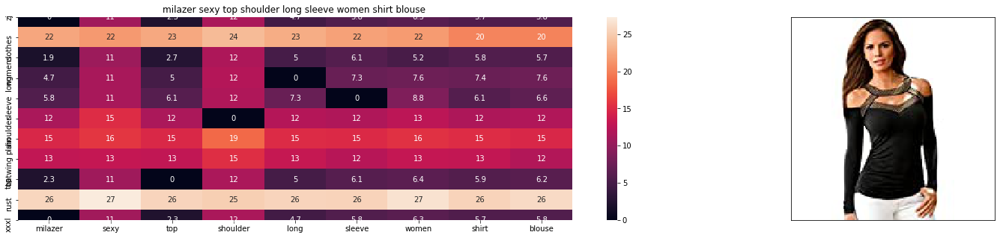

ASIN : B01MXMI7D1
Brand : Milazer
euclidean distance from input : 2.8953680112718674


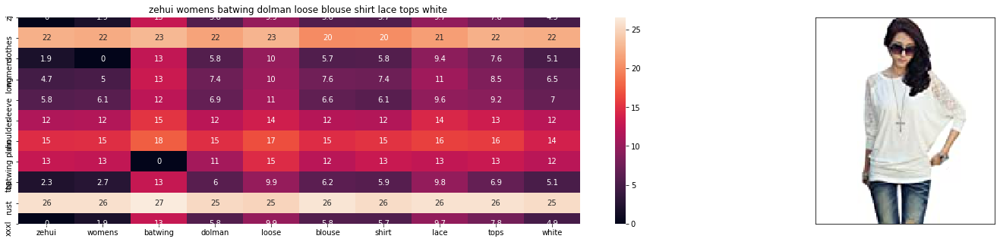

ASIN : B00CII5ZXE
Brand : Zehui
euclidean distance from input : 2.900614173686418


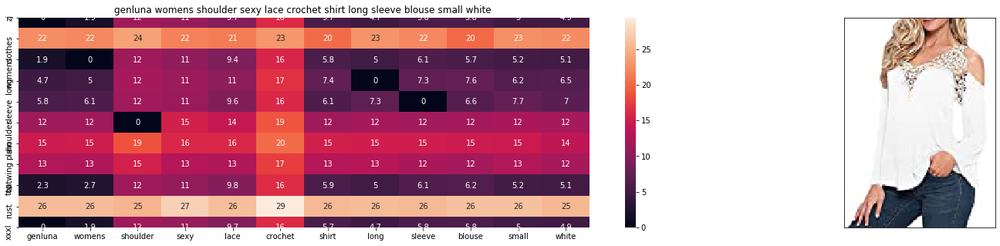

ASIN : B01LZRBG03
Brand : Genluna
euclidean distance from input : 2.903420074260149


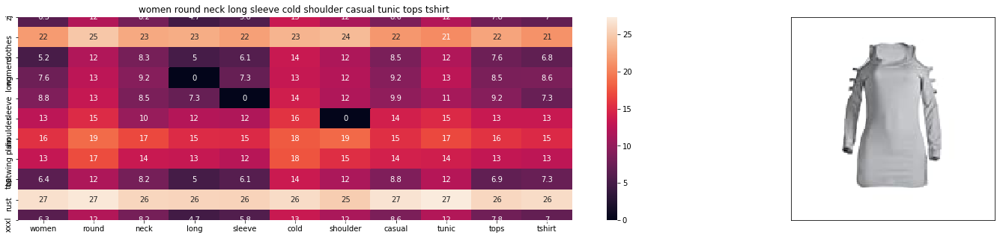

ASIN : B0753XR2HQ
Brand : YF
euclidean distance from input : 2.9042518689989185


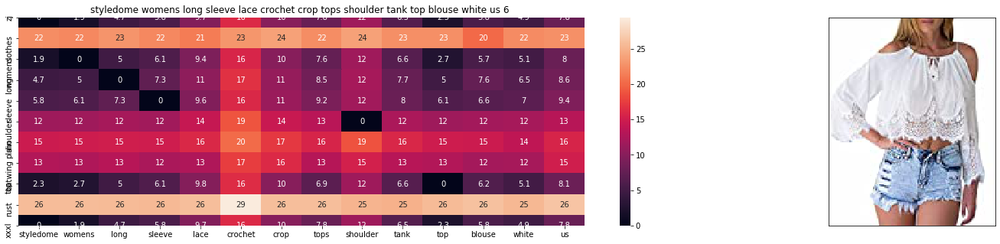

ASIN : B06WLLV8G3
Brand : StyleDome
euclidean distance from input : 2.9094060972093674


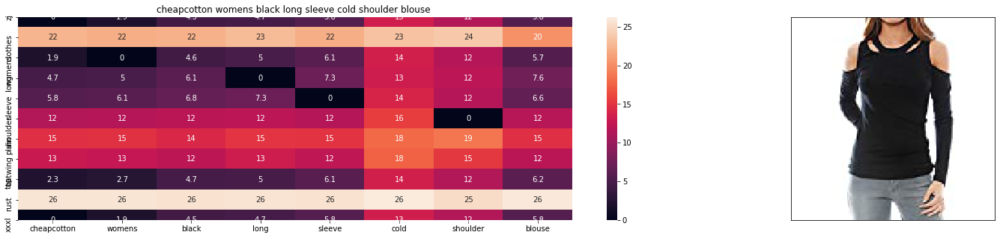

ASIN : B00Q2ZDJLO
Brand : Cheapcotton
euclidean distance from input : 2.909919173991594


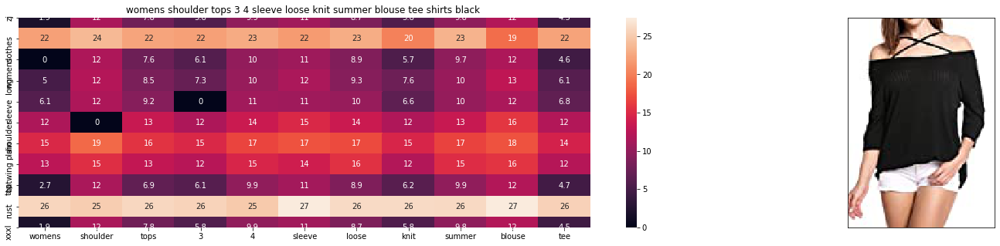

ASIN : B071G2C7Q4
Brand : JQstar
euclidean distance from input : 2.9118921354173755


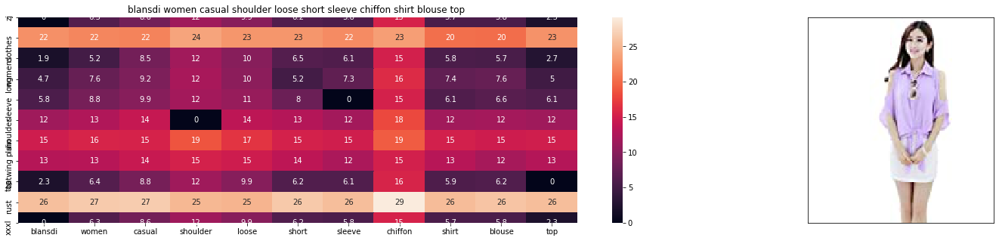

ASIN : B01AY1280E
Brand : Blansdi
euclidean distance from input : 2.933110626017961


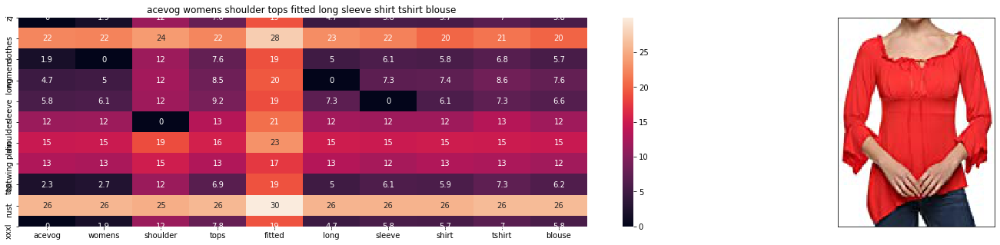

ASIN : B01CE4GHBK
Brand : ACEVOG
euclidean distance from input : 2.9429704740404223


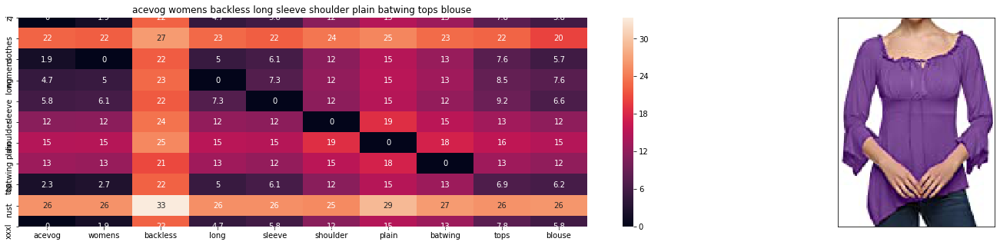

ASIN : B01CE4GMGU
Brand : ACEVOG
euclidean distance from input : 2.9438007429002857


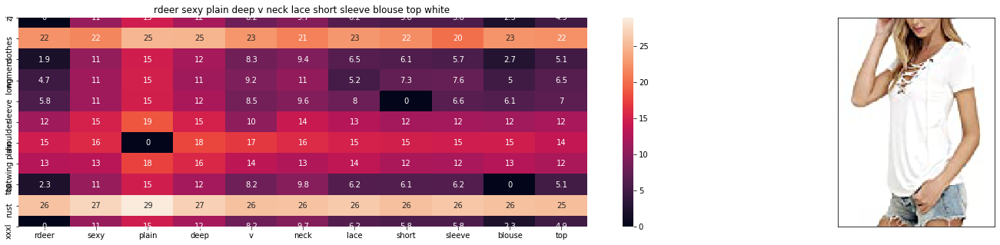

ASIN : B073CXJSB5
Brand : R-deer
euclidean distance from input : 2.9443143918871018


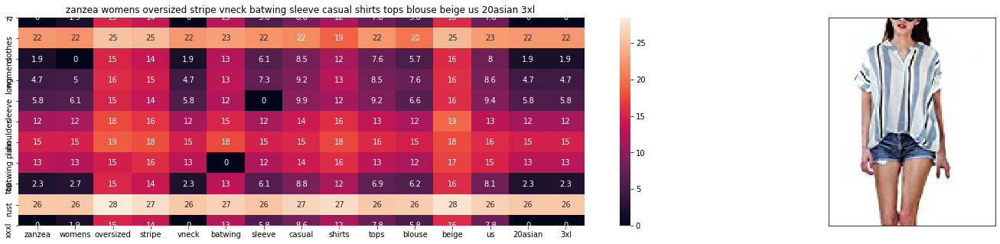

ASIN : B01KJZUDAM
Brand : ZANZEA
euclidean distance from input : 2.949084480082903


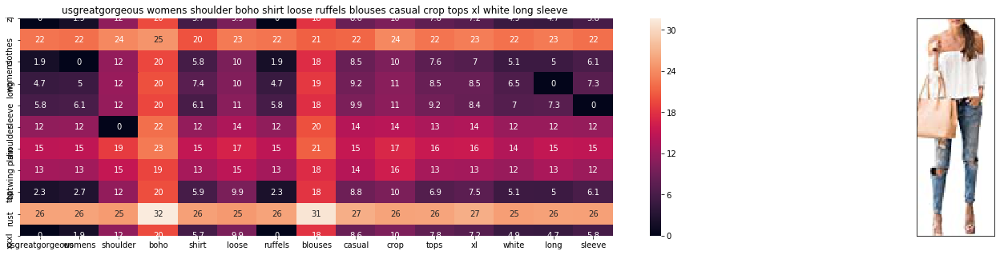

ASIN : B073QGHX79
Brand : USGreatgorgeous
euclidean distance from input : 2.949418838298235


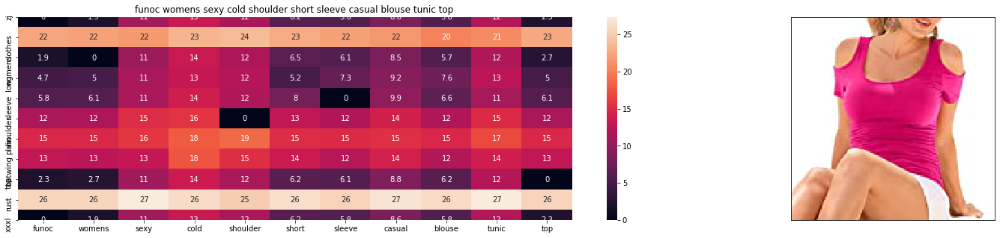

ASIN : B01KHJU4Q8
Brand : FUNOC
euclidean distance from input : 2.9561926634448117


In [39]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12000, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

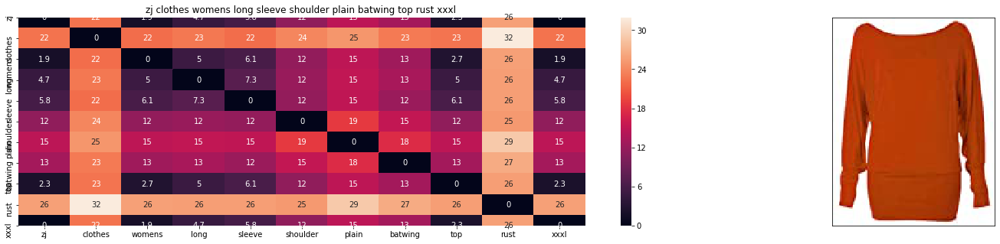

ASIN : B017N15BHK
Brand : ZJ Clothes
euclidean distance from input : 0.0


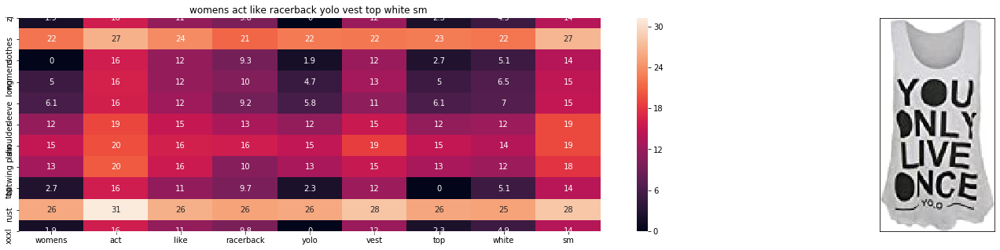

ASIN : B01ERYB9XQ
Brand : ZJ Clothes
euclidean distance from input : 1.7102053558860524


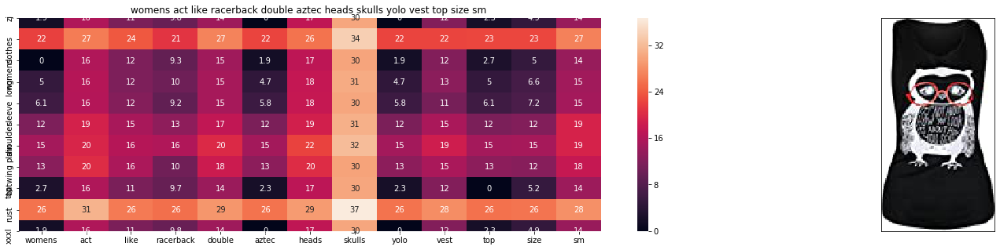

ASIN : B01ERYBAF8
Brand : ZJ Clothes
euclidean distance from input : 1.7244216228649232


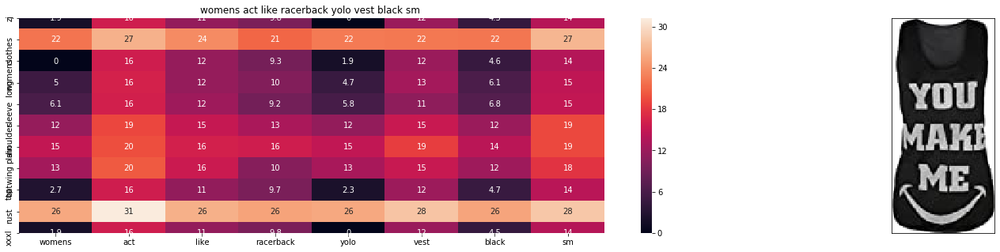

ASIN : B01ERYB8QY
Brand : ZJ Clothes
euclidean distance from input : 1.7288999040594366


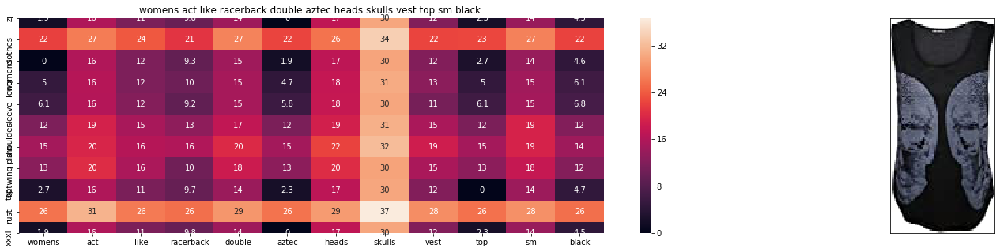

ASIN : B01ERYBCZ6
Brand : ZJ Clothes
euclidean distance from input : 1.7386996185813648


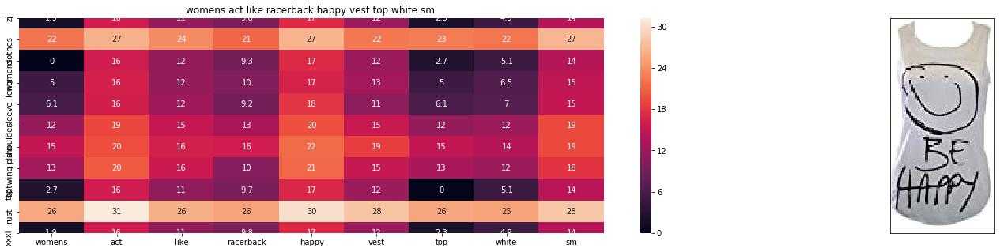

ASIN : B01ERYB9C2
Brand : ZJ Clothes
euclidean distance from input : 1.743701102845392


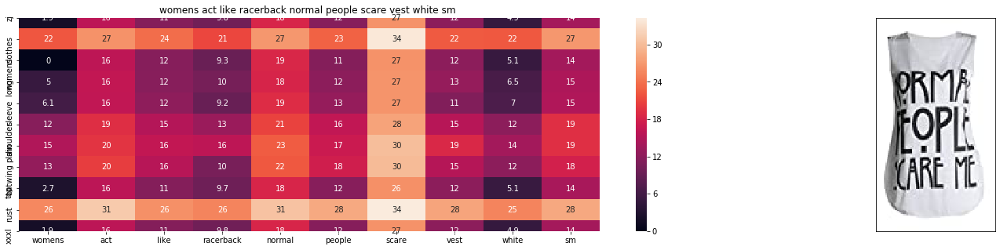

ASIN : B01ERYB7G0
Brand : ZJ Clothes
euclidean distance from input : 1.7977076793834779


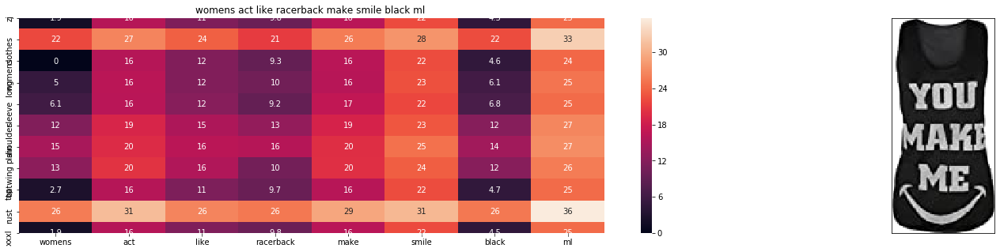

ASIN : B01ERYB9CM
Brand : ZJ Clothes
euclidean distance from input : 1.8403989274969366


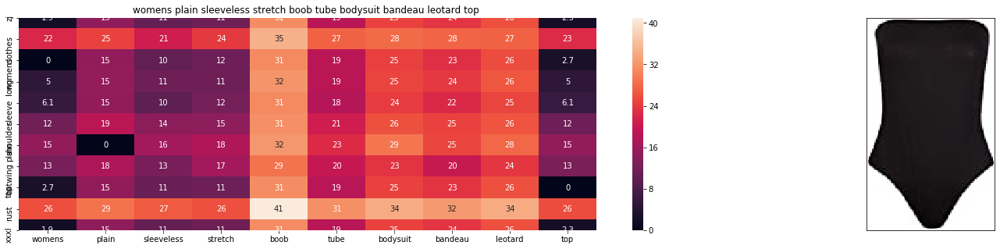

ASIN : B0721YCCH1
Brand : ZJ Clothes
euclidean distance from input : 2.046229830983709


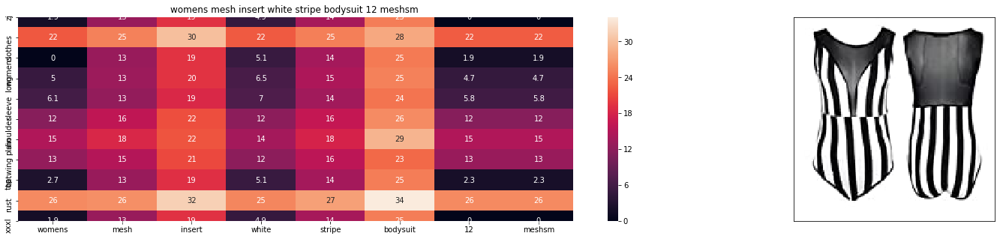

ASIN : B07465Y93L
Brand : ZJ Clothes
euclidean distance from input : 2.0956647245210673


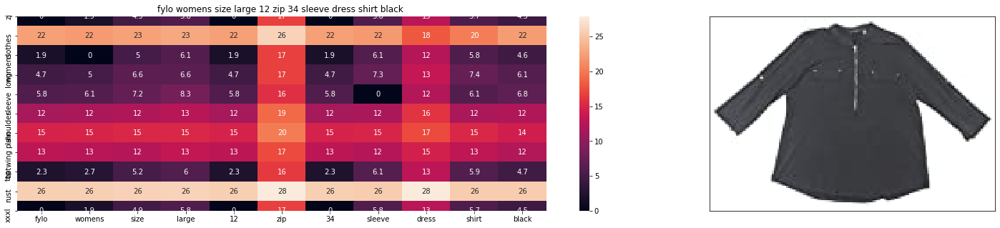

ASIN : B0718Y9J4M
Brand : f
euclidean distance from input : 2.1763493277809838


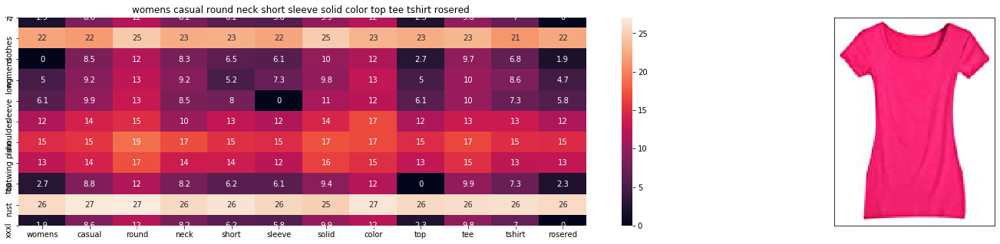

ASIN : B010NND0DC
Brand : AM CLOTHES
euclidean distance from input : 2.1887271187522193


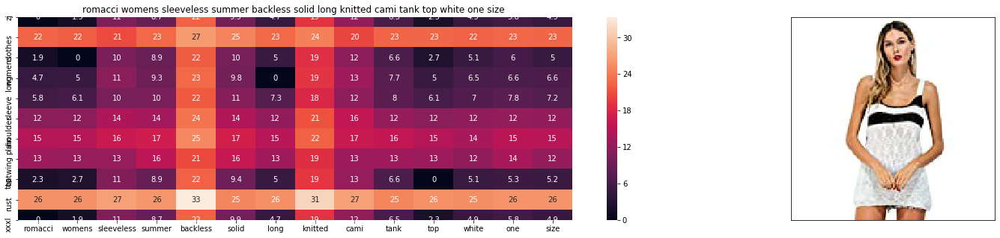

ASIN : B06Y5SPNC2
Brand : Romacci
euclidean distance from input : 2.1906153938987036


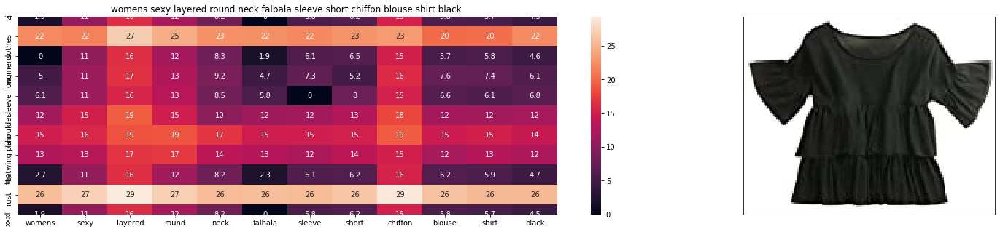

ASIN : B00ZOZEIZO
Brand : AM CLOTHES
euclidean distance from input : 2.1908307855779476


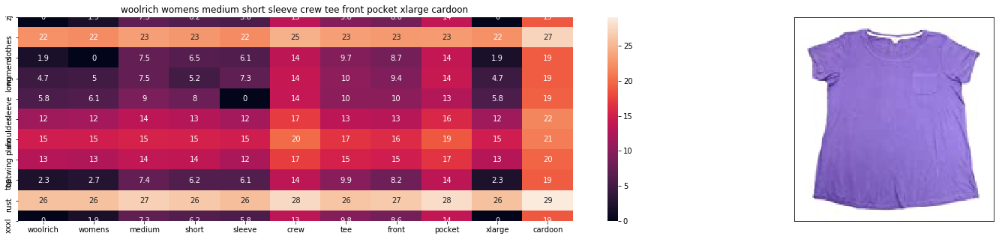

ASIN : B06XKTV2TB
Brand : W
euclidean distance from input : 2.2026750391179863


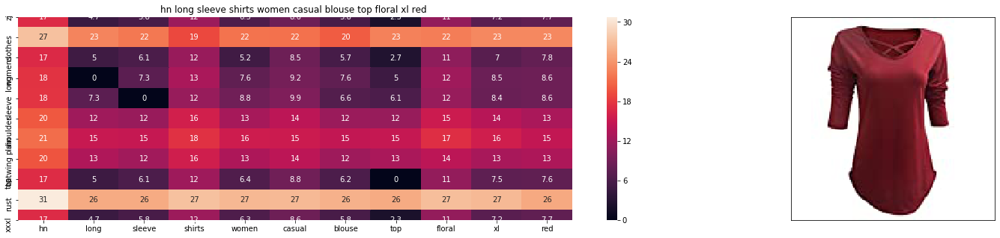

ASIN : B0711KH9DX
Brand : H&N
euclidean distance from input : 2.2087340268221767


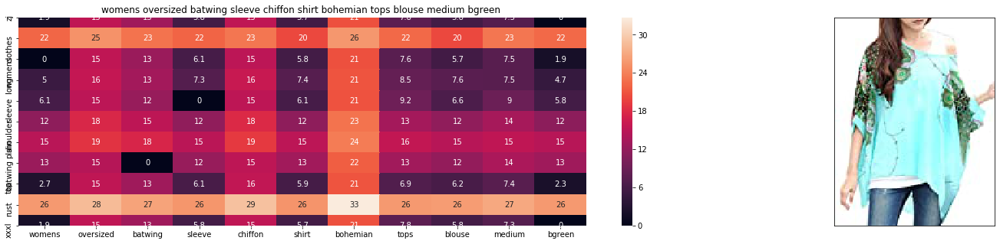

ASIN : B010NJID6U
Brand : AM CLOTHES
euclidean distance from input : 2.225618362426758


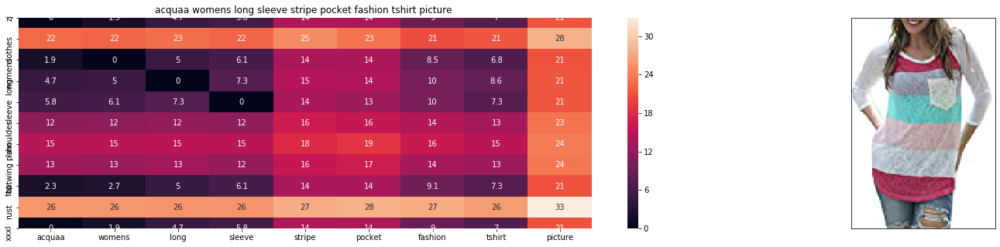

ASIN : B06XK2ZRFH
Brand : Acquaa
euclidean distance from input : 2.2342058355158025


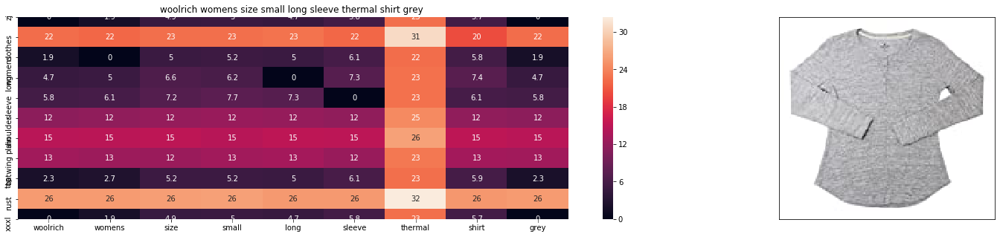

ASIN : B072R5TR1Z
Brand : W
euclidean distance from input : 2.239178362759677


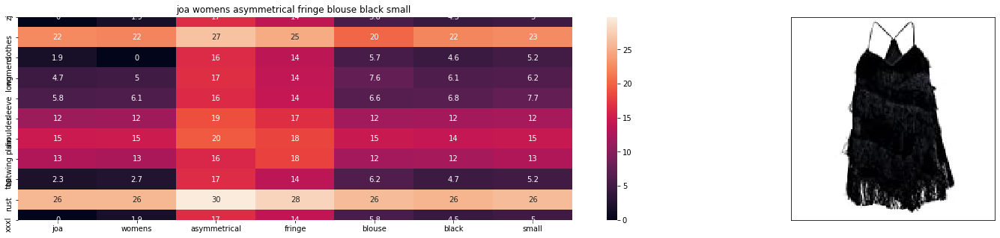

ASIN : B0721ZGF6S
Brand : J.O.A.
euclidean distance from input : 2.251486067338423


In [40]:
# brand and color weight =50
# title vector weight = 5

idf_w2v_brand(12000, 5, 50, 20)

# Keras and Tensorflow to extract features

In [41]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

Using TensorFlow backend.


#  Visual features based product similarity.

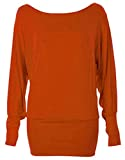

Product Title:  zj clothes womens long sleeve shoulder plain batwing top rust xxxl 
Euclidean Distance from input image: 5.8788432e-06
Amazon Url: www.amazon.com/dp/B017N15BHK


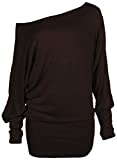

Product Title:  new ladies plus size long batwing sleeve shoulder baggy tops  brown 1x  
Euclidean Distance from input image: 34.852818
Amazon Url: www.amazon.com/dp/B00MJPVIDW


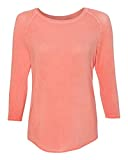

Product Title:  j america 8232  womens oasis wash 34 sleeve tshirt 
Euclidean Distance from input image: 35.5534
Amazon Url: www.amazon.com/dp/B01E9ZFOE8


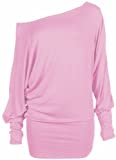

Product Title:  funky boutique womens long sleeve shoulder plain batwing top baby pink 1214 ml 
Euclidean Distance from input image: 36.29151
Amazon Url: www.amazon.com/dp/B009FV8R7I


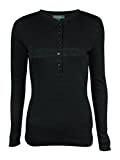

Product Title:  lrl lauren jeans co womens metallic striped knit henley xs black 
Euclidean Distance from input image: 36.407894
Amazon Url: www.amazon.com/dp/B01AGSCRUG


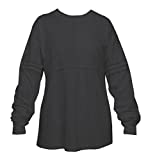

Product Title:  charcoal grey pom pom pullover shirt women small 
Euclidean Distance from input image: 36.87539
Amazon Url: www.amazon.com/dp/B00MPWIAXA


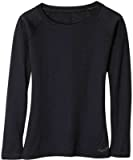

Product Title:  kuhl womens vega long sleeve shirt  black  medium 
Euclidean Distance from input image: 37.892727
Amazon Url: www.amazon.com/dp/B00700AUV2


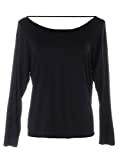

Product Title:  anna kaci sm fit womens boat neck long sleeve broad keyhole sweatshirt black 
Euclidean Distance from input image: 38.012764
Amazon Url: www.amazon.com/dp/B01934R2P4


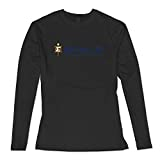

Product Title:  ambom black sigma xi scientific research society 100 cotton shirts womens size l 
Euclidean Distance from input image: 38.12623
Amazon Url: www.amazon.com/dp/B0177XFXH2


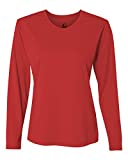

Product Title:  badger sport womens c2 long sleeve tee shirt large red 
Euclidean Distance from input image: 38.154102
Amazon Url: www.amazon.com/dp/B00R2TUDCM


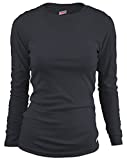

Product Title:  mjsoffe 227v tissue tee black small 
Euclidean Distance from input image: 38.4634
Amazon Url: www.amazon.com/dp/B001CEVA7U


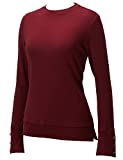

Product Title:  regna x basic womens round neck long bell sleeve button detail lightweight tee top tshirt wine xlarge 
Euclidean Distance from input image: 38.469604
Amazon Url: www.amazon.com/dp/B01N9OIJVA


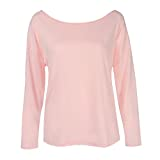

Product Title:  sodialr women spring autumn bandage shirts full sleeve solid casual blouse oneck women tops blouses sexy hollow blousespinksus4uk8 
Euclidean Distance from input image: 38.513195
Amazon Url: www.amazon.com/dp/B07336178W


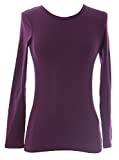

Product Title:  boden womens crewneck velvet trim tee us sz 2 byzantium 
Euclidean Distance from input image: 38.538143
Amazon Url: www.amazon.com/dp/B01H62T4CO


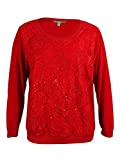

Product Title:  ny collection plus size long sleeve sequin top 2x red 
Euclidean Distance from input image: 38.941635
Amazon Url: www.amazon.com/dp/B015LLSRX4


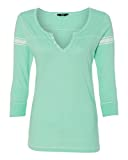

Product Title:  mv sport ladies henley mintmedium 
Euclidean Distance from input image: 39.26912
Amazon Url: www.amazon.com/dp/B01LBLOMSC


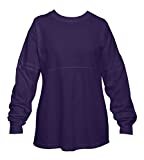

Product Title:  boxercraft spirit jersey pom pom pullover  adult sizes purple xxlarge 
Euclidean Distance from input image: 39.336334
Amazon Url: www.amazon.com/dp/B00VXQX1Z6


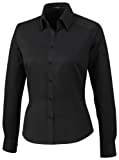

Product Title:  ladies wrinkle free 2ply 80s cotton stripe jacquard taped shirt xxl black 
Euclidean Distance from input image: 39.383484
Amazon Url: www.amazon.com/dp/B00HS5H4WM


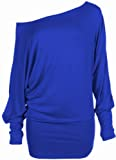

Product Title:  funky boutique womens long sleeve shoulder plain batwing top electric blue 810 sm 
Euclidean Distance from input image: 39.414062
Amazon Url: www.amazon.com/dp/B009FV8I9K


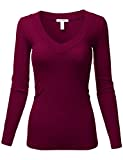

Product Title:  basic fitted sexy knit long sleeve vneck tee tops 
Euclidean Distance from input image: 39.666092
Amazon Url: www.amazon.com/dp/B01A9G8NPS


In [42]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amazon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12000, 20)
